## Objective

1. Time series analysis in depth. 

2. The following has been followed as a part of the process
    - EDA, handling NaN vals and why is it so important?
    - EDA on the number of complaints
    - Overview of different Categories and current complaints
    - Insights on how Time series prediction can help predict the Number of complaints.

3. The commented section is for future analysis

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
# Import all packages
import numpy as np
import pandas as pd
import pandas_profiling

import seaborn as sns
import pylab,datetime
import matplotlib.pyplot as plt
import simplejson as json


# import plotly.plotly as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go

# for iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import warnings
warnings.filterwarnings("ignore")

In [3]:
# import sys
# !{sys.executable} -m pip install statsmodels --user

In [4]:
#Import csv files
df = pd.read_csv("complaints.csv")
# df_hr = pd.read_csv("hour.csv")



In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1531946 entries, 0 to 1531945
Data columns (total 18 columns):
 #   Column                        Non-Null Count    Dtype 
---  ------                        --------------    ----- 
 0   Date received                 1531946 non-null  object
 1   Product                       1531946 non-null  object
 2   Sub-product                   1296781 non-null  object
 3   Issue                         1531946 non-null  object
 4   Sub-issue                     976089 non-null   object
 5   Consumer complaint narrative  511545 non-null   object
 6   Company public response       578399 non-null   object
 7   Company                       1531946 non-null  object
 8   State                         1181019 non-null  object
 9   ZIP code                      1155570 non-null  object
 10  Tags                          206706 non-null   object
 11  Consumer consent provided?    921280 non-null   object
 12  Submitted via                 1531946 non-

In [6]:
df.head()

,Date received,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Tags,Consumer consent provided?,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID
0,2012-01-30,Credit card,NaN,Payoff process,NaN,NaN,NaN,BARCLAYS BANK DELAWARE,FL,33634,NaN,NaN,Web,2012-01-31,Closed with relief,Yes,No,18663
1,2013-08-07,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"FIRST HAWAIIAN, INC.",HI,96816,NaN,NaN,Web,2013-08-07,Closed with explanation,Yes,No,482822
2,2011-12-01,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"CITIBANK, N.A.",WA,98275,NaN,NaN,Web,2011-12-11,Closed with relief,Yes,No,2329
3,2013-05-16,Credit card,NaN,Billing disputes,NaN,NaN,NaN,DISCOVER BANK,LA,70809,NaN,NaN,Web,2013-05-17,Closed with explanation,Yes,No,409064
4,2013-02-19,Credit card,NaN,Credit reporting,NaN,NaN,NaN,SYNCHRONY FINANCIAL,VA,22546,NaN,NaN,Web,2013-02-21,Closed with non-monetary relief,Yes,No,318532


In [7]:
df.isna().sum()

Date received                         0
Product                               0
Sub-product                      235165
Issue                                 0
Sub-issue                        555857
Consumer complaint narrative    1020401
Company public response          953547
Company                               0
State                            350927
ZIP code                         376376
Tags                            1325240
Consumer consent provided?       610666
Submitted via                         0
Date sent to company                  0
Company response to consumer          1
Timely response?                      0
Consumer disputed?               763467
Complaint ID                          0
dtype: int64

- 90% of web complaints are resolved, imagine if there is a "call" complain, see if the company is able to resolve it

- crewate a new column if the compplaint is closed or not (filter) and get the date diff. 

In [8]:
#renaming columns
df = df.rename(columns = {"Consumer complaint narrative": "Consumer_complaint_narrative", 
                          "Company public response":"Company_public_response", 
                          "Consumer disputed?": "Consumer_disputed",
                          "Consumer consent provided?": "Consumer_consent_provided",
                          "ZIP code" : "ZIPcode",
                          "Company response to consumer": "Company_response_to_consumer",
                          "Complaint ID": "Complaint_ID",
                          "Submitted via": "Submitted_via",
                          "Date sent to company": "Date_sent_to_company",
                          "Sub-product":"Sub_product",
                          "Timely response?": "Timely_response",
                          "Date received": "Date_received",
                          "Sub-issue":"Sub_issue"
                         })

In [9]:
df.head()

,Date_received,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,Consumer_consent_provided,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID
0,2012-01-30,Credit card,NaN,Payoff process,NaN,NaN,NaN,BARCLAYS BANK DELAWARE,FL,33634,NaN,NaN,Web,2012-01-31,Closed with relief,Yes,No,18663
1,2013-08-07,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"FIRST HAWAIIAN, INC.",HI,96816,NaN,NaN,Web,2013-08-07,Closed with explanation,Yes,No,482822
2,2011-12-01,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"CITIBANK, N.A.",WA,98275,NaN,NaN,Web,2011-12-11,Closed with relief,Yes,No,2329
3,2013-05-16,Credit card,NaN,Billing disputes,NaN,NaN,NaN,DISCOVER BANK,LA,70809,NaN,NaN,Web,2013-05-17,Closed with explanation,Yes,No,409064
4,2013-02-19,Credit card,NaN,Credit reporting,NaN,NaN,NaN,SYNCHRONY FINANCIAL,VA,22546,NaN,NaN,Web,2013-02-21,Closed with non-monetary relief,Yes,No,318532


In [10]:
#handling Null vals for Consumer_disputed  here by replacing it with "UNKNOWN"
df['Consumer_disputed'] = df['Consumer_disputed'].fillna("Unknown")


In [11]:
# Converting to the correct datatype
df['Issue'] = df.Issue.astype('category')
df['Date_received'] = df.Date_received.astype('category')
df['Product'] = df.Product.astype('category')
df['Sub_issue'] = df.Sub_issue.astype('category')
df['Consumer_complaint_narrative'] = df.Consumer_complaint_narrative.astype('category')
df['Company_public_response'] = df.Company_public_response.astype('category')
df['Company'] = df.Company.astype('category')
df['Consumer_consent_provided'] = df.Consumer_consent_provided.astype('category')
df['Company_response_to_consumer'] = df.Company_response_to_consumer.astype('category')
df['Submitted_via'] = df.Submitted_via.astype('category')
df['Sub_product'] = df.Sub_product.astype('category')
df['Consumer_disputed'] = df.Consumer_disputed.astype('category')
df['Timely_response'] = df.Timely_response.astype('category')
# df['Submitted_via'] = df.Submitted_via.astype('category')

In [12]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1531946 entries, 0 to 1531945
Data columns (total 18 columns):
 #   Column                        Non-Null Count    Dtype   
---  ------                        --------------    -----   
 0   Date_received                 1531946 non-null  category
 1   Product                       1531946 non-null  category
 2   Sub_product                   1296781 non-null  category
 3   Issue                         1531946 non-null  category
 4   Sub_issue                     976089 non-null   category
 5   Consumer_complaint_narrative  511545 non-null   category
 6   Company_public_response       578399 non-null   category
 7   Company                       1531946 non-null  category
 8   State                         1181019 non-null  object  
 9   ZIPcode                       1155570 non-null  object  
 10  Tags                          206706 non-null   object  
 11  Consumer_consent_provided     921280 non-null   category
 12  Submitted_via 

In [13]:
df['Product'].value_counts()[0:10]

Credit reporting, credit repair services, or o...    352638
Mortgage                                             299118
Debt collection                                      283630
Credit reporting                                     140432
Credit card                                           89190
Bank account or service                               86206
Credit card or prepaid card                           69614
Checking or savings account                           64103
Student loan                                          56886
Consumer Loan                                         31604
Name: Product, dtype: int64

In [14]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# sns.set(style="whitegrid")

# # Initialize the matplotlib figure
# f, ax = plt.subplots(figsize=(6, 15))

# # Load the example car crash dataset
# # crashes = sns.load_dataset("car_crashes").sort_values("total", ascending=False)
# x = df[df['Product']=="Credit reporting, credit repair services, or other personal consumer reports"].value_counts()

# # Plot the total crashes
# sns.set_color_codes("pastel")
# sns.barplot(x=df.shape[0], y="State", data=df,
#             label="Total", color="b")

# # Plot the crashes where alcohol was involved
# sns.set_color_codes("muted")
# sns.barplot(x=x, y="State", data=df,
#             label="prod categ", color="b")

# # Add a legend and informative axis label
# ax.legend(ncol=2, loc="lower right", frameon=True)
# ax.set(xlim=(0, 24), ylabel="",
#        xlabel="Products and complaints")
# sns.despine(left=True, bottom=True)

In [15]:
# # # pandas_profiling.ProfileReport(df)
# pandas_profiling.ProfileReport(df).to_file("Statistical_report.html") 



In [16]:
#df.set_index(['ISSUE','PRODUCT','SUB_ISSUE','COMPANY','SUBMITTED_VIA'],inplace=True)
df[['Issue','Date_received','Product','Sub_issue','Consumer_complaint_narrative',
    'Company','Company_public_response','Consumer_consent_provided','Company_response_to_consumer','Submitted_via']].describe().transpose()



,count,unique,top,freq
Issue,1531946,168,Incorrect information on your report,218378
Date_received,1531946,3125,2017-09-08,3553
Product,1531946,18,"Credit reporting, credit repair services, or o...",352638
Sub_issue,976089,219,Information belongs to someone else,114401
Consumer_complaint_narrative,511545,480474,There are many mistakes appear in my report wi...,1035
Company,1531946,5513,"EQUIFAX, INC.",153476
Company_public_response,578399,11,Company has responded to the consumer and the ...,421891
Consumer_consent_provided,921280,4,Consent provided,511885
Company_response_to_consumer,1531945,8,Closed with explanation,1187991
Submitted_via,1531946,6,Web,1152747


### Understanding the data and finding the unique values in every column

In [17]:
df["Product"].unique()
len(df["Product"].unique())

['Credit card', 'Credit reporting', 'Mortgage', 'Consumer Loan', 'Student loan', ..., 'Money transfers', 'Payday loan, title loan, or personal loan', 'Money transfer, virtual currency, or money se..., 'Other financial service', 'Virtual currency']
Length: 18
Categories (18, object): ['Credit card', 'Credit reporting', 'Mortgage', 'Consumer Loan', ..., 'Payday loan, title loan, or personal loan', 'Money transfer, virtual currency, or money se..., 'Other financial service', 'Virtual currency']

18

In [18]:
# df["Sub-product"].unique()
# len(df["Sub-product"].unique())

In [19]:
df["Issue"].unique()
len(df["Issue"].unique())

['Payoff process', 'Billing disputes', 'Credit reporting', 'Incorrect information on credit report', 'Other', ..., 'Property was sold', 'Overdraft, savings, or rewards features', 'Lender damaged or destroyed vehicle', 'Problem with an overdraft', 'dsfdsfsfsd']
Length: 168
Categories (168, object): ['Payoff process', 'Billing disputes', 'Credit reporting', 'Incorrect information on credit report', ..., 'Overdraft, savings, or rewards features', 'Lender damaged or destroyed vehicle', 'Problem with an overdraft', 'dsfdsfsfsd']

168

In [20]:
df["Company"].unique()
len(df["Company"].unique())

['BARCLAYS BANK DELAWARE', 'FIRST HAWAIIAN, INC.', 'CITIBANK, N.A.', 'DISCOVER BANK', 'SYNCHRONY FINANCIAL', ..., 'PACIFIC PREMIER BANCORP, INC.', 'CLA Co, Inc.', 'FIRST MERCHANTS CORPORATION', 'Zillow Group Marketplace, Inc.', 'Home Financial Corporation']
Length: 5513
Categories (5513, object): ['BARCLAYS BANK DELAWARE', 'FIRST HAWAIIAN, INC.', 'CITIBANK, N.A.', 'DISCOVER BANK', ..., 'CLA Co, Inc.', 'FIRST MERCHANTS CORPORATION', 'Zillow Group Marketplace, Inc.', 'Home Financial Corporation']

5513

In [21]:
df["State"].unique()


array(['FL', 'HI', 'WA', 'LA', 'VA', 'MA', 'GA', 'CO', 'TX', 'NY', 'SC',
       'AZ', 'NC', 'CA', 'KY', 'DC', 'NH', 'IA', 'OR', 'MS', 'TN', 'NJ',
       'OH', 'KS', 'AR', nan, 'MD', 'PA', 'SD', 'NM', 'CT', 'MN', 'MI',
       'DE', 'AL', 'OK', 'IL', 'NE', 'NV', 'IN', 'MO', 'AE', 'PR', 'WV',
       'ND', 'WI', 'PW', 'UT', 'RI', 'ME', 'VT', 'ID', 'FM', 'AK', 'MP',
       'AP', 'MT', 'MH', 'GU', 'WY',
       'UNITED STATES MINOR OUTLYING ISLANDS', 'VI', 'AS', 'AA'],
      dtype=object)

In [22]:
df["Tags"].unique()
len(df["Tags"].unique())

array([nan, 'Servicemember', 'Older American',
       'Older American, Servicemember'], dtype=object)

4

In [23]:
df["Consumer_consent_provided"].unique()
len(df["Consumer_consent_provided"].unique())

[NaN, 'Consent not provided', 'Other', 'Consent provided', 'Consent withdrawn']
Categories (4, object): ['Consent not provided', 'Other', 'Consent provided', 'Consent withdrawn']

5

In [24]:
df["Tags"].unique()

array([nan, 'Servicemember', 'Older American',
       'Older American, Servicemember'], dtype=object)

In [25]:
df["Submitted_via"].unique()

['Web', 'Referral', 'Postal mail', 'Phone', 'Fax', 'Email']
Categories (6, object): ['Web', 'Referral', 'Postal mail', 'Phone', 'Fax', 'Email']

In [26]:
df["Company_response_to_consumer"].unique()

['Closed with relief', 'Closed with explanation', 'Closed with non-monetary relief', 'Closed without relief', 'Closed with monetary relief', 'Closed', 'Untimely response', 'In progress', NaN]
Categories (8, object): ['Closed with relief', 'Closed with explanation', 'Closed with non-monetary relief', 'Closed without relief', 'Closed with monetary relief', 'Closed', 'Untimely response', 'In progress']

In [27]:
df["Consumer_disputed"].unique()

['No', 'Yes', 'Unknown']
Categories (3, object): ['No', 'Yes', 'Unknown']

<AxesSubplot:>

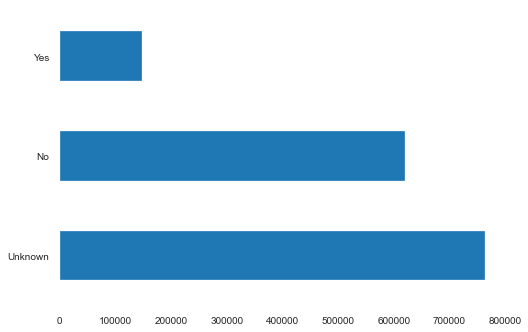

In [28]:
df['Consumer_disputed'].value_counts().sort_values(ascending=False).head(30).plot(kind='barh')



In [29]:
df["Timely_response"].unique()

['Yes', 'No']
Categories (2, object): ['Yes', 'No']

<AxesSubplot:>

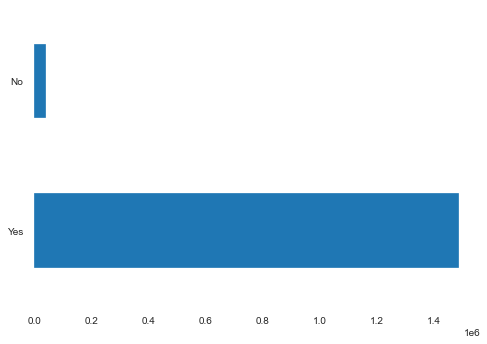

In [30]:
df['Timely_response'].value_counts().sort_values(ascending=False).head(30).plot(kind='barh')



In [31]:
df.shape

(1531946, 18)

In [32]:
df['Product'].value_counts().sort_values(ascending=False).to_dict()


{'Credit reporting, credit repair services, or other personal consumer reports': 352638,
 'Mortgage': 299118,
 'Debt collection': 283630,
 'Credit reporting': 140432,
 'Credit card': 89190,
 'Bank account or service': 86206,
 'Credit card or prepaid card': 69614,
 'Checking or savings account': 64103,
 'Student loan': 56886,
 'Consumer Loan': 31604,
 'Vehicle loan or lease': 15902,
 'Money transfer, virtual currency, or money service': 14479,
 'Payday loan, title loan, or personal loan': 12351,
 'Payday loan': 5543,
 'Money transfers': 5354,
 'Prepaid card': 3819,
 'Other financial service': 1059,
 'Virtual currency': 18}

<AxesSubplot:>

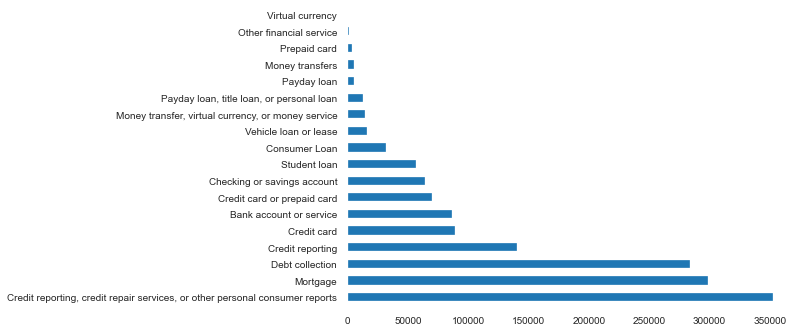

In [33]:
df['Product'].value_counts().sort_values(ascending=False).head(30).plot(kind='barh')



#### What are the top 10 issues and sub issues?

[Text(0.5, 0, 'Number of Complaints'),
 Text(0, 0.5, 'Issue'),
 Text(0.5, 1.0, 'Top 10 Issues')]

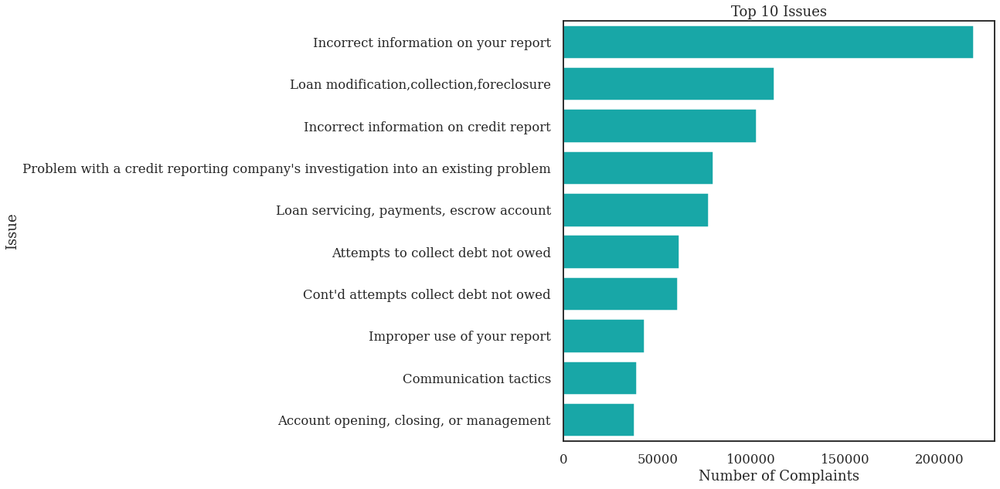

In [34]:
fig = plt.figure(figsize=(10,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

issue_count=df['Issue'].str.strip("'").value_counts()[0:10]
issue_c=pd.DataFrame({'Issue':issue_count.index, 'Vals':issue_count.values})

# f, ax = plt.subplots(figsize=(7, 3))
g = sns.barplot(x=issue_c['Vals'], y=issue_c['Issue'], ci=None, color="c")
g.set(xlabel= "Number of Complaints", ylabel="Issue", title = "Top 10 Issues")


# g.set_xticklabels(rotation=30)

# for item in g.get_xticklabels():
#     item.set_rotation(45)

### Top 10 companies with the max number of consumer complaints

[Text(0.5, 0, 'Number of Complaints'),
 Text(0, 0.5, 'Company'),
 Text(0.5, 1.0, 'Top 10 Companies with consumer complaints')]

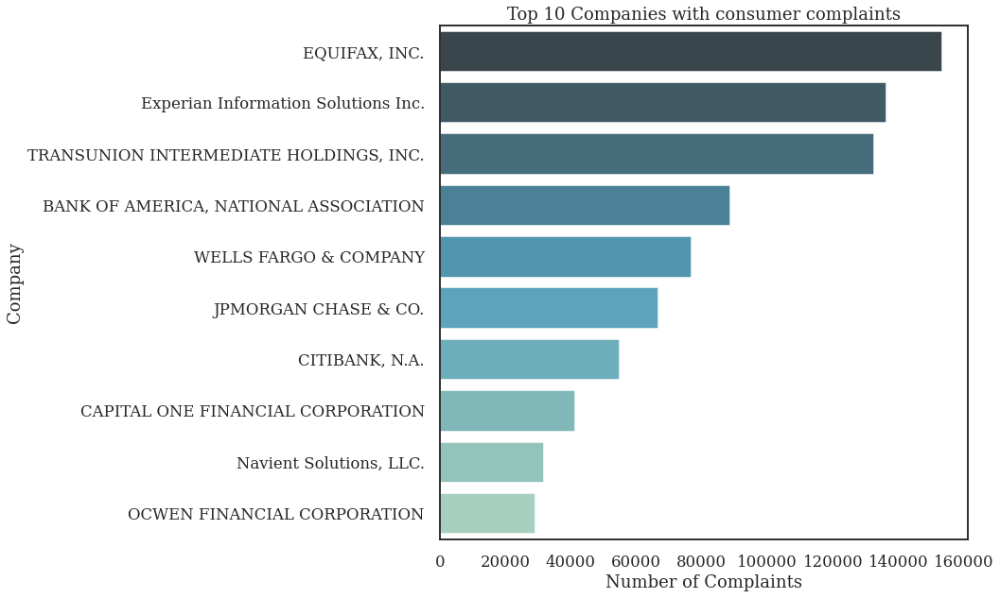

In [35]:
# sns.palplot(sns.color_palette("GnBu_d"))

fig = plt.figure(figsize=(10,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

comp_ten=df['Company'].str.strip("'").value_counts()[0:10]
c_topten=pd.DataFrame({'Company':comp_ten.index, 'Vals':comp_ten.values})

# flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#d6ff78", "#90c418", "#cc1818", "#000000", "#fc8b00", "#fcdf00", "#fc00df", "#ef95fc","#2707f7","#57f707","#f7076f","#344ce3"]
g = sns.barplot(x=c_topten['Vals'], y=c_topten['Company'], ci=None, palette="GnBu_d")
g.set(xlabel= "Number of Complaints", ylabel="Company", title = "Top 10 Companies with consumer complaints")



# ax = sns.countplot(x="Company", data=df, palette="Set3")



### Top Product categories with high number of complaints

[Text(0.5, 0, 'Number of Complaints'),
 Text(0, 0.5, 'Company'),
 Text(0.5, 1.0, 'Top Product categories with consumer complaints')]

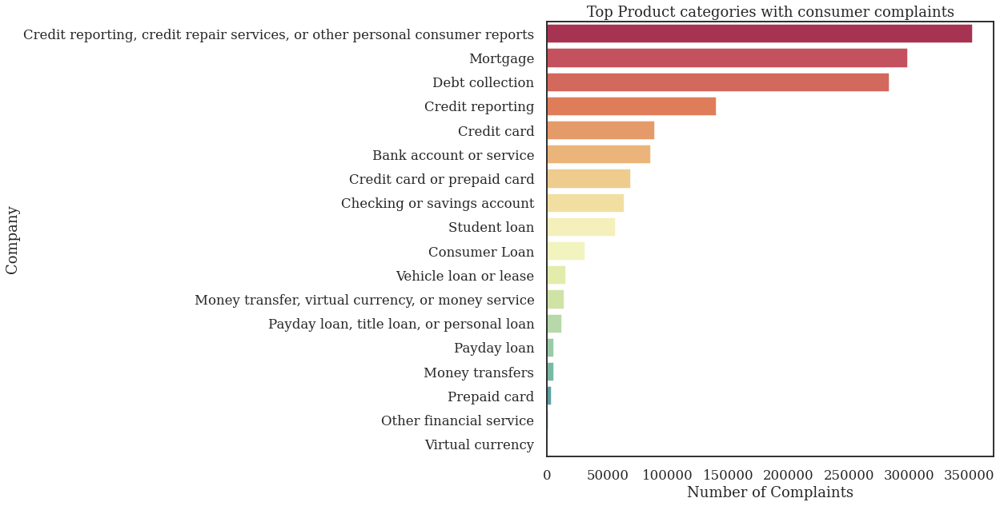

In [36]:
# sns.palplot(sns.color_palette("GnBu_d"))
fig = plt.figure(figsize=(10,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

prod=df['Product'].str.strip("'").value_counts()
p=pd.DataFrame({'Product':prod.index, 'Vals':prod.values})

# flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#d6ff78", "#90c418", "#cc1818", "#000000", "#fc8b00", "#fcdf00", "#fc00df", "#ef95fc","#2707f7","#57f707","#f7076f","#344ce3"]
g = sns.barplot(x=p['Vals'], y=p['Product'], ci=None, palette="Spectral")
g.set(xlabel= "Number of Complaints", ylabel="Company", title = "Top Product categories with consumer complaints")

In [37]:
# df['Company'].str.strip("'").value_counts()[0:10]

# sns.set(style='white')
# df['Company'].str.strip("'").value_counts()[0:10].iplot(kind='bar',color='#FF6692',title='Top 10 Companies with highest complaints',
#                                                         fontsize=10,
#                                                         dimensions=(500, 1100),world_readable=True)



In [38]:
# import seaborn as sns 
# # fig = plt.figure(figsize=(10,10))


# sns.set(style='white')
# df['Issue'].str.strip("'").value_counts()[0:10].iplot(kind='bar',title='Top 10 issues',fontsize=10,color='#FF6692',dimensions=(500, 1100),world_readable=True)

# # color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"]

In [39]:
# df['Sub_issue'].str.strip("'").value_counts()[0:10].iplot(kind='bar',
#                                                           title='Top 10 Sub Issues',fontsize=14,color='#9370DB')


(-0.5, 2999.5, 1999.5, -0.5)

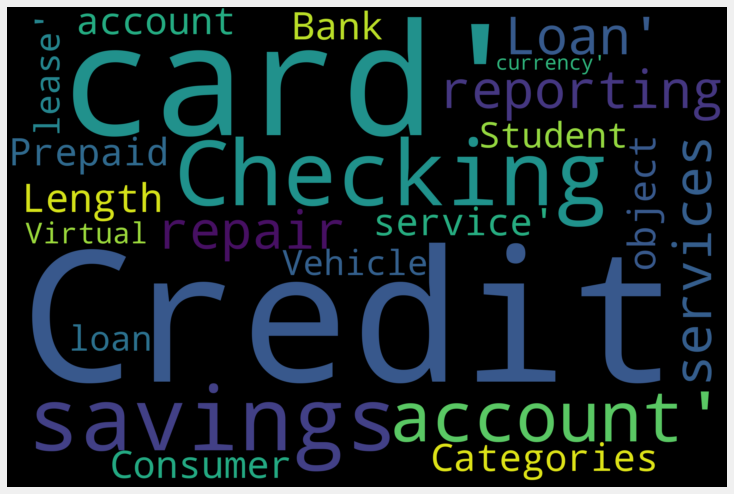

In [40]:
from wordcloud import WordCloud, STOPWORDS

%matplotlib inline
text = df['Product'].values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))

fig = plt.figure(
    figsize = (10, 8),
    facecolor = '#F0F0F0',
    edgecolor = '#F0F0F0')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)

<AxesSubplot:>

Text(0.5, 1.0, 'Main Issues with Disputes')

(-0.5, 399.5, 199.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Main Issues without Disputes')

(-0.5, 399.5, 199.5, -0.5)

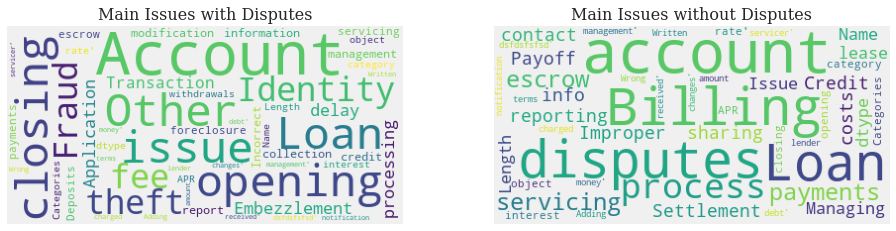

In [41]:
stopwords = set(STOPWORDS)

# Main Issue in Disputes - plot 1
disputes_issue = df['Issue'].loc[df['Consumer_disputed'] == 'Yes']

disputed_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=300,
    max_font_size=60, 
    random_state=42
    ).generate(str(disputes_issue)
)

fig = plt.figure(figsize=(16,8))
fig.add_subplot(221)
plt.imshow(disputed_wordcloud)
plt.title('Main Issues with Disputes', fontsize=16)
plt.axis('off')


#  Issue with NO Disputes - plot 2
nodisputes_issue = df['Issue'].loc[df['Consumer_disputed'] == 'No']

nodispute_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=300,
    max_font_size=60, 
    random_state=42
    ).generate(str(nodisputes_issue))

fig.add_subplot(222)
plt.imshow(nodispute_wordcloud)
plt.title('Main Issues without Disputes', fontsize=16)
plt.axis('off')



<AxesSubplot:>

Text(0.5, 1.0, 'Main Issues with Unknown Disputes')

(-0.5, 399.5, 199.5, -0.5)

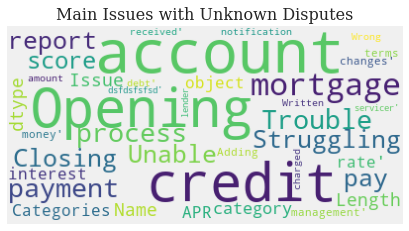

In [42]:
#  Issue with UNKNOWN Disputes - plot 3
unknowndisputes_issue = df['Issue'].loc[df['Consumer_disputed'] == 'Unknown']

Unknowndispute_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=300,
    max_font_size=60, 
    random_state=42
    ).generate(str(unknowndisputes_issue))

fig = plt.figure(figsize=(16,8))

fig.add_subplot(222)
plt.imshow(Unknowndispute_wordcloud)
plt.title('Main Issues with Unknown Disputes', fontsize=16)
plt.axis('off')
plt.show()

<AxesSubplot:>

Text(0.5, 1.0, 'Bank of America Disputes')

(-0.5, 399.5, 199.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Wells Fargo & Company Disputes')

(-0.5, 399.5, 199.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'JP Morgan Chase & Co.')

(-0.5, 399.5, 199.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Equifax')

(-0.5, 399.5, 199.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'CitiBank')

(-0.5, 399.5, 199.5, -0.5)

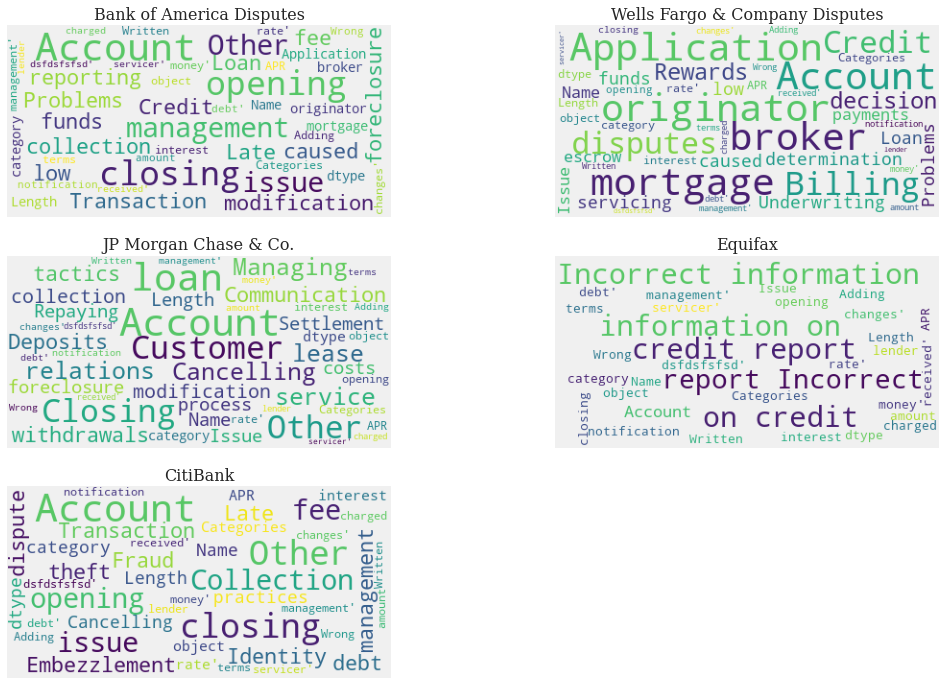

In [43]:
boa_dis = df['Issue'].loc[(df['Consumer_disputed'] == 'Yes') & (df['Company'] == "BANK OF AMERICA, NATIONAL ASSOCIATION")]
wfc_dis = df['Issue'].loc[(df['Consumer_disputed'] == 'Yes') & (df['Company'] == "WELLS FARGO & COMPANY")]
jpm_dis = df['Issue'].loc[(df['Consumer_disputed'] == 'Yes') & (df['Company'] == "JPMORGAN CHASE & CO.")] 
equi_dis = df['Issue'].loc[(df['Consumer_disputed'] == 'Yes') & (df['Company'] == "EQUIFAX, INC.")]
citi_dis = df['Issue'].loc[(df['Consumer_disputed'] == 'Yes') & (df['Company'] == "CITIBANK, N.A.")]


# Create Subplots of Wordclouds
fig = plt.figure(figsize=(18,12))

# First Subplot
plt.subplot(3, 2, 1)
boa_disputed_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=500,
    max_font_size=40, 
    random_state=42
    ).generate(str(boa_dis)
)

plt.imshow(boa_disputed_wordcloud)
plt.title('Bank of America Disputes', fontsize=16)
plt.axis('off')

# Second Subplot
plt.subplot(3, 2, 2)
wfc_disputed_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=500,
    max_font_size=40, 
    random_state=42
    ).generate(str(wfc_dis)
)

plt.imshow(wfc_disputed_wordcloud)
plt.title('Wells Fargo & Company Disputes', fontsize=16)
plt.axis('off')

plt.subplot(3, 2, 3)
jpm_disputed_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=500,
    max_font_size=40, 
    random_state=42
    ).generate(str(jpm_dis)
)

plt.imshow(jpm_disputed_wordcloud)
plt.title('JP Morgan Chase & Co.', fontsize=16)
plt.axis('off')


plt.subplot(3, 2, 4)
equi_disputed_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=500,
    max_font_size=40, 
    random_state=42
    ).generate(str(equi_dis)
)

plt.imshow(equi_disputed_wordcloud)
plt.title('Equifax', fontsize=16)
plt.axis('off')

plt.subplot(3, 2, 5)
citi_disputed_wordcloud = WordCloud(
    background_color='#F0F0F0',
    stopwords=stopwords,
    max_words=500,
    max_font_size=40, 
    random_state=42
    ).generate(str(citi_dis)
)

plt.imshow(citi_disputed_wordcloud)
plt.title('CitiBank', fontsize=16)
plt.axis('off')

#### what is how much % of the total:1531946

1. <b>tags</b>: has <B>86.506965650225%</B> of NAN vals.
2. <b>Consumer_complaint_narrative</b>: has 1020401 NAN vals which is <b>66.608157206586%</b> of total(1531946).
3. <b>Company_public_response</b>: has 953547 NAN vals which is <b>62.244165264311%</b> of 1531946.
4. <b>Consumer_disputed?</b>: has 763467 NAN vals which is <b>49.836417210528%</b> of 1531946.
5. <b>Consumer_consent_provided</b>: has 610666 NAN vals which is <b>39.862110022155%</b> of 1531946
6. <b>Sub-issue</b>: has 555857 NAN vals which is <b>36.284372947872%</b> of 1531946.
7. <b>ZIPcode</b>: has 376376 NAN vals which is <b>24.56849001205%</b> of 1531946.
8. <b>State</b>: has 350927 NAN vals which is <b>22.907269577387%</b> of 1531946.
9. <b>Sub-product</b>: 235165 NAN vals which is <b>15.35073690587%</b> of 1531946.










In [44]:
df.isna().sum()

Date_received                         0
Product                               0
Sub_product                      235165
Issue                                 0
Sub_issue                        555857
Consumer_complaint_narrative    1020401
Company_public_response          953547
Company                               0
State                            350927
ZIPcode                          376376
Tags                            1325240
Consumer_consent_provided        610666
Submitted_via                         0
Date_sent_to_company                  0
Company_response_to_consumer          1
Timely_response                       0
Consumer_disputed                     0
Complaint_ID                          0
dtype: int64

# Time series and col: No. of days taken to resolve

In [45]:
df.head()

ts = df.copy()

,Date_received,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,Consumer_consent_provided,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID
0,2012-01-30,Credit card,NaN,Payoff process,NaN,NaN,NaN,BARCLAYS BANK DELAWARE,FL,33634,NaN,NaN,Web,2012-01-31,Closed with relief,Yes,No,18663
1,2013-08-07,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"FIRST HAWAIIAN, INC.",HI,96816,NaN,NaN,Web,2013-08-07,Closed with explanation,Yes,No,482822
2,2011-12-01,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"CITIBANK, N.A.",WA,98275,NaN,NaN,Web,2011-12-11,Closed with relief,Yes,No,2329
3,2013-05-16,Credit card,NaN,Billing disputes,NaN,NaN,NaN,DISCOVER BANK,LA,70809,NaN,NaN,Web,2013-05-17,Closed with explanation,Yes,No,409064
4,2013-02-19,Credit card,NaN,Credit reporting,NaN,NaN,NaN,SYNCHRONY FINANCIAL,VA,22546,NaN,NaN,Web,2013-02-21,Closed with non-monetary relief,Yes,No,318532


In [46]:
ts.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1531946 entries, 0 to 1531945
Data columns (total 18 columns):
 #   Column                        Non-Null Count    Dtype   
---  ------                        --------------    -----   
 0   Date_received                 1531946 non-null  category
 1   Product                       1531946 non-null  category
 2   Sub_product                   1296781 non-null  category
 3   Issue                         1531946 non-null  category
 4   Sub_issue                     976089 non-null   category
 5   Consumer_complaint_narrative  511545 non-null   category
 6   Company_public_response       578399 non-null   category
 7   Company                       1531946 non-null  category
 8   State                         1181019 non-null  object  
 9   ZIPcode                       1155570 non-null  object  
 10  Tags                          206706 non-null   object  
 11  Consumer_consent_provided     921280 non-null   category
 12  Submitted_via 

In [47]:
ts['Date_received'] = ts.Date_received.astype('datetime64[ns]')
ts['Date_sent_to_company'] = ts.Date_sent_to_company.astype('datetime64[ns]')





In [48]:
ts['Number of days'] = (ts['Date_sent_to_company'] - ts['Date_received']) 
ts['Number of days']

0          1 days
1          0 days
2         10 days
3          1 days
4          2 days
            ...  
1531941    0 days
1531942    0 days
1531943    0 days
1531944    0 days
1531945    0 days
Name: Number of days, Length: 1531946, dtype: timedelta64[ns]

In [49]:
ts['Number_of_days'] = (ts['Date_sent_to_company'] - ts['Date_received'])// np.timedelta64(1, 'D')
ts['Number_of_days']


0           1
1           0
2          10
3           1
4           2
           ..
1531941     0
1531942     0
1531943     0
1531944     0
1531945     0
Name: Number_of_days, Length: 1531946, dtype: int64

In [50]:
ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1531946 entries, 0 to 1531945
Data columns (total 20 columns):
 #   Column                        Non-Null Count    Dtype          
---  ------                        --------------    -----          
 0   Date_received                 1531946 non-null  datetime64[ns] 
 1   Product                       1531946 non-null  category       
 2   Sub_product                   1296781 non-null  category       
 3   Issue                         1531946 non-null  category       
 4   Sub_issue                     976089 non-null   category       
 5   Consumer_complaint_narrative  511545 non-null   category       
 6   Company_public_response       578399 non-null   category       
 7   Company                       1531946 non-null  category       
 8   State                         1181019 non-null  object         
 9   ZIPcode                       1155570 non-null  object         
 10  Tags                          206706 non-null   object

In [51]:
ts.describe()


,Complaint_ID,Number of days,Number_of_days
count,1.531946e+06,1531946,1.531946e+06
mean,2.377496e+06,2 days 19:33:26.017966690,2.814884e+00
std,1.253335e+06,13 days 22:03:14.770058739,1.391892e+01
min,1.000000e+00,-85 days +00:00:00,-8.500000e+01
25%,1.333746e+06,0 days 00:00:00,0.000000e+00
50%,2.441295e+06,0 days 00:00:00,0.000000e+00
75%,3.609077e+06,2 days 00:00:00,2.000000e+00
max,4.141455e+06,1962 days 00:00:00,1.962000e+03


In [52]:
# ts['Number_of_days'].max()
# ts['Number_of_days'].min()

# print(ts[ts['Number_of_days']==1962])
# print(ts[ts['Number_of_days']==-85])

<AxesSubplot:xlabel='Number_of_days'>

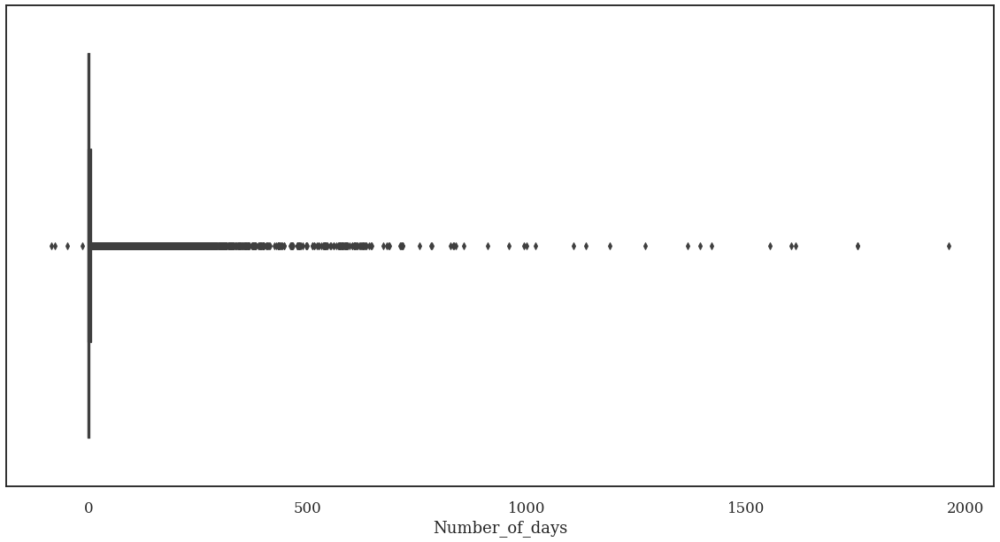

In [53]:
a4_dims = (20,10)
f, ax = plt.subplots(figsize=a4_dims)
sns.boxplot(ax=ax,x=ts['Number_of_days'])

- we note that the number of days taken to resolve an issue varies -ve to 2000+ days which is rather odd

In [54]:
ts.Date_received.describe()
ts.Date_sent_to_company.describe()

count                 1531946
unique                   3125
top       2017-09-08 00:00:00
freq                     3553
first     2011-12-01 00:00:00
last      2020-06-25 00:00:00
Name: Date_received, dtype: object

count                 1531946
unique                   3074
top       2017-09-08 00:00:00
freq                     3387
first     2011-12-01 00:00:00
last      2020-06-25 00:00:00
Name: Date_sent_to_company, dtype: object

### Indexed with Date_received - ts1

In [55]:
ts_date_received = ts.set_index('Date_received')
ts_date_received.head()


,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,Consumer_consent_provided,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID,Number of days,Number_of_days
Date_received,,,,,,,,,,,,,,,,,,,
2012-01-30,Credit card,NaN,Payoff process,NaN,NaN,NaN,BARCLAYS BANK DELAWARE,FL,33634,NaN,NaN,Web,2012-01-31,Closed with relief,Yes,No,18663,1 days,1
2013-08-07,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"FIRST HAWAIIAN, INC.",HI,96816,NaN,NaN,Web,2013-08-07,Closed with explanation,Yes,No,482822,0 days,0
2011-12-01,Credit card,NaN,Billing disputes,NaN,NaN,NaN,"CITIBANK, N.A.",WA,98275,NaN,NaN,Web,2011-12-11,Closed with relief,Yes,No,2329,10 days,10
2013-05-16,Credit card,NaN,Billing disputes,NaN,NaN,NaN,DISCOVER BANK,LA,70809,NaN,NaN,Web,2013-05-17,Closed with explanation,Yes,No,409064,1 days,1
2013-02-19,Credit card,NaN,Credit reporting,NaN,NaN,NaN,SYNCHRONY FINANCIAL,VA,22546,NaN,NaN,Web,2013-02-21,Closed with non-monetary relief,Yes,No,318532,2 days,2


In [56]:
ts_date_received['Year'] = ts_date_received.index.year
ts_date_received['Month'] = ts_date_received.index.month
ts_date_received['Weekday_Name'] = ts_date_received.index.day_name()


In [57]:
prod = ts_date_received[ts_date_received['Product']=="Credit reporting, credit repair services, or other personal consumer reports"]
prod.head(3)
prod1 = prod.copy()

,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,...,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID,Number of days,Number_of_days,Year,Month,Weekday_Name
Date_received,,,,,,,,,,,,,,,,,,,,,
2017-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,NaN,NaN,"EQUIFAX, INC.",IL,60653,NaN,...,2017-10-12,Closed with explanation,Yes,Unknown,2700307,0 days,0,2017,10,Thursday
2018-05-23,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,NaN,NaN,"EQUIFAX, INC.",FL,34761,NaN,...,2018-05-23,Closed with explanation,Yes,Unknown,3481731,0 days,0,2018,5,Wednesday
2018-11-07,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Information belongs to someone else,NaN,NaN,"EQUIFAX, INC.",NaN,NaN,NaN,...,2018-11-07,Closed with explanation,Yes,Unknown,3552603,0 days,0,2018,11,Wednesday


In [58]:
# prod.drop('Sub_product', axis=1, inplace=True)
# prod.drop('Sub_issue', axis=1, inplace=True)
prod.drop('Consumer_complaint_narrative', axis=1, inplace=True)
prod.drop('Company_public_response', axis=1, inplace=True)
prod.drop('ZIPcode', axis=1, inplace=True)
prod.drop('Tags', axis=1, inplace=True)
prod.drop('Consumer_consent_provided', axis=1, inplace=True)
prod.drop('Complaint_ID', axis=1, inplace=True)

In [59]:
prod.head()

,Product,Sub_product,Issue,Sub_issue,Company,State,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Number of days,Number_of_days,Year,Month,Weekday_Name
Date_received,,,,,,,,,,,,,,,,
2017-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,"EQUIFAX, INC.",IL,Postal mail,2017-10-12,Closed with explanation,Yes,Unknown,0 days,0,2017,10,Thursday
2018-05-23,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,"EQUIFAX, INC.",FL,Referral,2018-05-23,Closed with explanation,Yes,Unknown,0 days,0,2018,5,Wednesday
2018-11-07,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Information belongs to someone else,"EQUIFAX, INC.",NaN,Postal mail,2018-11-07,Closed with explanation,Yes,Unknown,0 days,0,2018,11,Wednesday
2018-11-26,"Credit reporting, credit repair services, or o...",Credit repair services,Fraud or scam,NaN,"EQUIFAX, INC.",NaN,Web,2018-11-26,Closed with explanation,Yes,Unknown,0 days,0,2018,11,Monday
2018-08-27,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,"EMCC Holdings, LLC",NaN,Fax,2018-08-27,Closed with explanation,Yes,Unknown,0 days,0,2018,8,Monday


In [60]:
prod.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 352638 entries, 2017-10-12 to 2020-04-26
Data columns (total 16 columns):
 #   Column                        Non-Null Count   Dtype          
---  ------                        --------------   -----          
 0   Product                       352638 non-null  category       
 1   Sub_product                   352638 non-null  category       
 2   Issue                         352638 non-null  category       
 3   Sub_issue                     351211 non-null  category       
 4   Company                       352638 non-null  category       
 5   State                         186950 non-null  object         
 6   Submitted_via                 352638 non-null  category       
 7   Date_sent_to_company          352638 non-null  datetime64[ns] 
 8   Company_response_to_consumer  352637 non-null  category       
 9   Timely_response               352638 non-null  category       
 10  Consumer_disputed             352638 non-null  categ

[Text(0.5, 0, 'Number of Complaints'),
 Text(0, 0.5, 'Company'),
 Text(0.5, 1.0, 'Top 10 states with consumer complaints')]

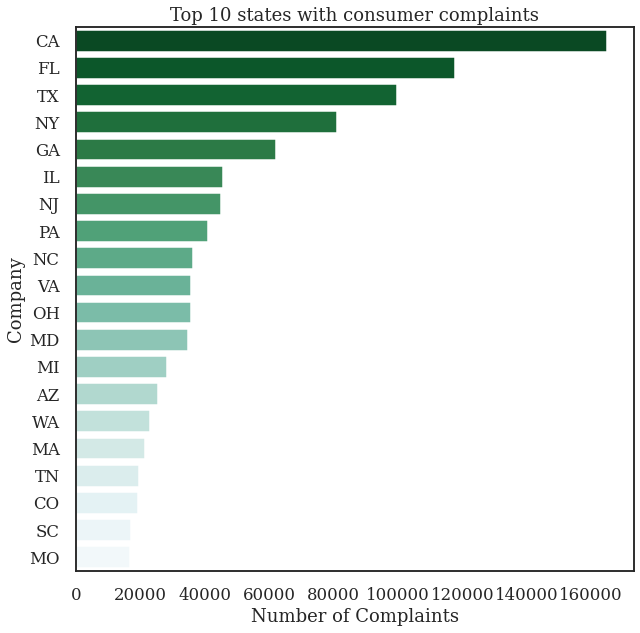

In [61]:
# list_data = prod.loc[:"2020","Company"],prod.loc[:"2020","State"],prod.loc[:"2020","Number_of_days"]
# ax = sns.lineplot(data=list_data)

# sns.palplot(sns.color_palette("GnBu_d"))
fig = plt.figure(figsize=(10,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

state=df['State'].str.strip("'").value_counts()[0:20]
p=pd.DataFrame({'state':state.index, 'Vals':state.values})

# flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#d6ff78", "#90c418", "#cc1818", "#000000", "#fc8b00", "#fcdf00", "#fc00df", "#ef95fc","#2707f7","#57f707","#f7076f","#344ce3"]
g = sns.barplot(x=p['Vals'], y=p['state'], ci=None, palette="BuGn_r")
g.set(xlabel= "Number of Complaints", ylabel="Company", title = "Top 10 states with consumer complaints")


In [62]:
# # list_data = [wide_df.loc[:"2005", "a"], wide_df.loc["2003":, "b"]]
# fig = plt.figure(figsize=(10,10))
# sns.set_context('talk')
# plt.rcParams['font.family'] = "serif"

# comp_ten=df['Company'].str.strip("'").value_counts()[0:10]
# c_topten=pd.DataFrame({'Company':comp_ten.index, 'Vals':comp_ten.values})

# # flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#d6ff78", "#90c418", "#cc1818", "#000000", "#fc8b00", "#fcdf00", "#fc00df", "#ef95fc","#2707f7","#57f707","#f7076f","#344ce3"]
# g = sns.barplot(x=c_topten['Vals'], y=c_topten['Company'], ci=None, palette="GnBu_d")
# g.set(xlabel= "Number of Complaints", ylabel="Company", title = "Top 10 Companies with consumer complaints")





In [63]:
# sns.tsplot(data=prod)

In [64]:
# import cufflinks as cf

# # Correct datatypes cufflinks does not support CategoryType so we make them strings and rebuild the dataframe. 
# source_df  = pd.DataFrame(source_counts).reset_index()
# flavor_df = pd.DataFrame(flavor_counts).reset_index()
# source_pie = source_df.iplot(kind='pie', labels='Source', values='FoodCode', colors=colors, title='Sources of Pie')
# flavor_pie = source_df.iplot(kind='pie', labels='Source', values='FoodCode', colors=colors, title='Flavors of Pie')

# display(source_pie, flavor_pie)

In [65]:
p1 = ts[ts['Product']=="Credit reporting, credit repair services, or other personal consumer reports"]
p1.head(3)

,Date_received,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,Consumer_consent_provided,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID,Number of days,Number_of_days
482,2017-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,NaN,NaN,"EQUIFAX, INC.",IL,60653,NaN,NaN,Postal mail,2017-10-12,Closed with explanation,Yes,Unknown,2700307,0 days,0
847,2018-05-23,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,NaN,NaN,"EQUIFAX, INC.",FL,34761,NaN,NaN,Referral,2018-05-23,Closed with explanation,Yes,Unknown,3481731,0 days,0
942,2018-11-07,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Information belongs to someone else,NaN,NaN,"EQUIFAX, INC.",NaN,NaN,NaN,NaN,Postal mail,2018-11-07,Closed with explanation,Yes,Unknown,3552603,0 days,0


<AxesSubplot:xlabel='Date_received', ylabel='Number_of_days'>

(array([17287., 17410., 17532., 17652., 17775., 17897., 18017., 18140.,
        18262., 18383.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

Text(0.5, 1.0, 'Number of days taken to acknowledge a complaint for prod category-1 ')

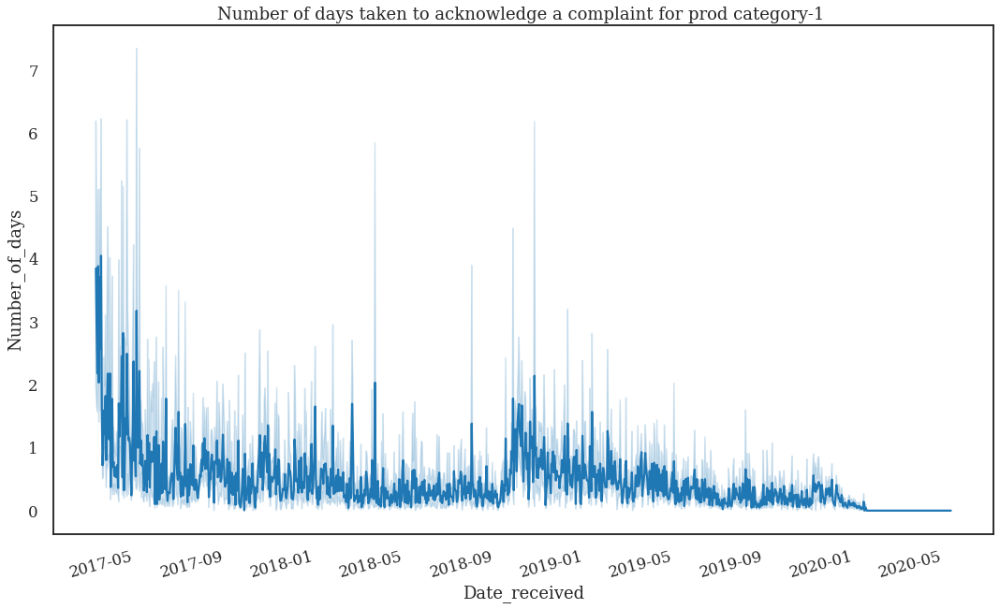

In [66]:
fig = plt.figure(figsize=(18,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

sns.lineplot(x="Date_received", y="Number_of_days", data=p1)
plt.xticks(rotation=15)
plt.title('Number of days taken to acknowledge a complaint for prod category-1 ')
plt.show()

<AxesSubplot:xlabel='Date_sent_to_company', ylabel='Number_of_days'>

(array([17287., 17410., 17532., 17652., 17775., 17897., 18017., 18140.,
        18262., 18383.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

Text(0.5, 1.0, 'Number of days taken to resolve a complaint for prod category-1 ')

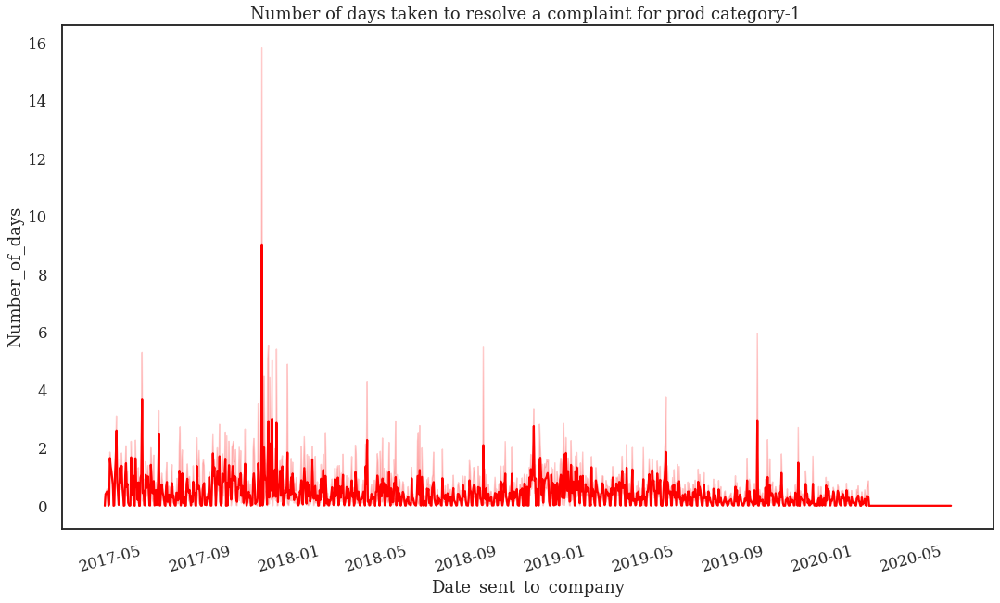

In [67]:
fig = plt.figure(figsize=(18,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

sns.lineplot(x="Date_sent_to_company", y="Number_of_days",color="red", data=p1)
plt.xticks(rotation=15)
plt.title('Number of days taken to resolve a complaint for prod category-1 ')
plt.show()

<AxesSubplot:xlabel='Date_sent_to_company', ylabel='Number_of_days'>

Text(0.5, 1.0, 'Number of days taken to resolve a complaint for prod category-1 ')

(array([17287., 17410., 17532., 17652., 17775., 17897., 18017., 18140.,
        18262., 18383.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

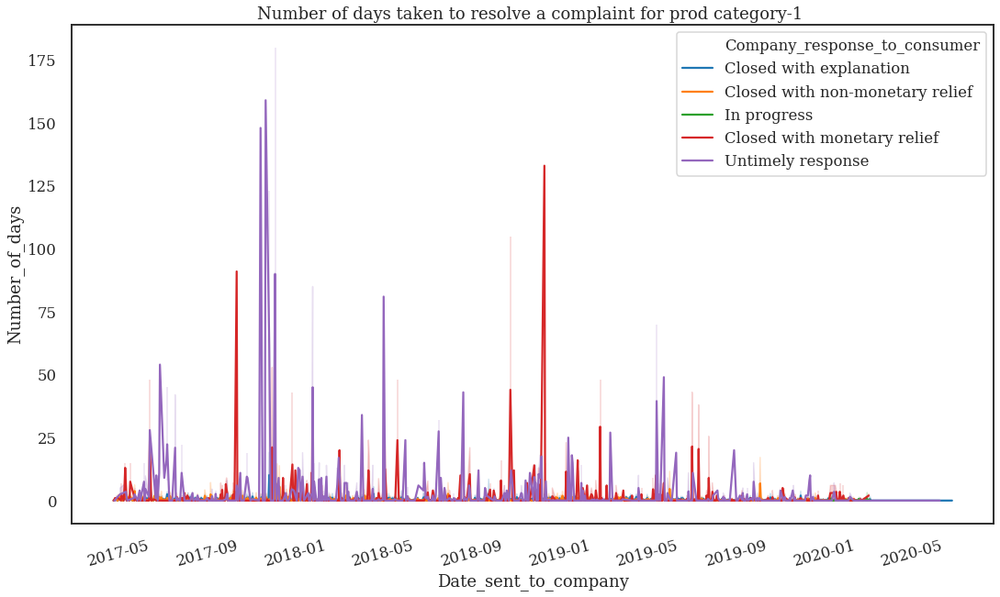

[Text(0.5, 0, 'Number of Complaints'),
 Text(0, 0.5, 'Company'),
 Text(0.5, 1.0, 'Top 10 Companies with consumer complaints')]

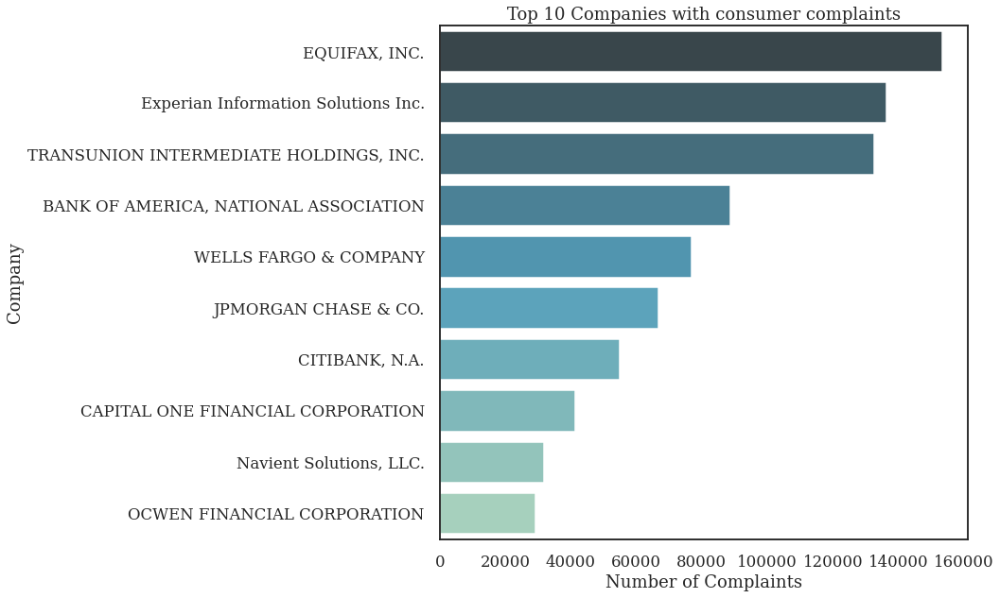

In [68]:
fig = plt.figure(figsize=(18,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

# sns.lineplot(x="Date_sent_to_company", y="Number_of_days",color="red", data=p1)
# plt.xticks(rotation=15)
# plt.title('Number of days taken to resolve a complaint for prod category-1 ')
# plt.show()

sns.lineplot(x='Date_sent_to_company', y='Number_of_days', hue='Company_response_to_consumer', data=p1)
plt.title('Number of days taken to resolve a complaint for prod category-1 ')


plt.xticks(rotation=15)

plt.show()





fig = plt.figure(figsize=(10,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

comp_ten=df['Company'].str.strip("'").value_counts()[0:10]
c_topten=pd.DataFrame({'Company':comp_ten.index, 'Vals':comp_ten.values})

# flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#d6ff78", "#90c418", "#cc1818", "#000000", "#fc8b00", "#fcdf00", "#fc00df", "#ef95fc","#2707f7","#57f707","#f7076f","#344ce3"]
g = sns.barplot(x=c_topten['Vals'], y=c_topten['Company'], ci=None, palette="GnBu_d")
g.set(xlabel= "Number of Complaints", ylabel="Company", title = "Top 10 Companies with consumer complaints")





In [69]:
prod.head(4)

,Product,Sub_product,Issue,Sub_issue,Company,State,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Number of days,Number_of_days,Year,Month,Weekday_Name
Date_received,,,,,,,,,,,,,,,,
2017-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,"EQUIFAX, INC.",IL,Postal mail,2017-10-12,Closed with explanation,Yes,Unknown,0 days,0,2017,10,Thursday
2018-05-23,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,"EQUIFAX, INC.",FL,Referral,2018-05-23,Closed with explanation,Yes,Unknown,0 days,0,2018,5,Wednesday
2018-11-07,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Information belongs to someone else,"EQUIFAX, INC.",NaN,Postal mail,2018-11-07,Closed with explanation,Yes,Unknown,0 days,0,2018,11,Wednesday
2018-11-26,"Credit reporting, credit repair services, or o...",Credit repair services,Fraud or scam,NaN,"EQUIFAX, INC.",NaN,Web,2018-11-26,Closed with explanation,Yes,Unknown,0 days,0,2018,11,Monday


- For different companies

In [70]:
prod.Company.value_counts()[0:15]

EQUIFAX = prod[prod["Company"]=="EQUIFAX, INC."]

TRANSUNION = prod[prod["Company"]=="TRANSUNION INTERMEDIATE HOLDINGS, INC."]

EQUIFAX, INC.                             102345
TRANSUNION INTERMEDIATE HOLDINGS, INC.     89810
Experian Information Solutions Inc.        87949
CAPITAL ONE FINANCIAL CORPORATION           5311
SYNCHRONY FINANCIAL                         3178
CITIBANK, N.A.                              2983
JPMORGAN CHASE & CO.                        2704
WELLS FARGO & COMPANY                       2354
BANK OF AMERICA, NATIONAL ASSOCIATION       2025
LEXISNEXIS                                  1971
Navient Solutions, LLC.                     1436
Alliance Data Card Services                 1323
DISCOVER BANK                               1208
Boarded AutoTesting Entity 1                1162
SANTANDER CONSUMER USA HOLDINGS INC.        1051
Name: Company, dtype: int64

In [71]:
EQUIFAX.head(2)
TRANSUNION.head(2)

,Product,Sub_product,Issue,Sub_issue,Company,State,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Number of days,Number_of_days,Year,Month,Weekday_Name
Date_received,,,,,,,,,,,,,,,,
2017-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,"EQUIFAX, INC.",IL,Postal mail,2017-10-12,Closed with explanation,Yes,Unknown,0 days,0,2017,10,Thursday
2018-05-23,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,"EQUIFAX, INC.",FL,Referral,2018-05-23,Closed with explanation,Yes,Unknown,0 days,0,2018,5,Wednesday


,Product,Sub_product,Issue,Sub_issue,Company,State,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Number of days,Number_of_days,Year,Month,Weekday_Name
Date_received,,,,,,,,,,,,,,,,
2018-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",NaN,Web,2018-10-12,Closed with explanation,Yes,Unknown,0 days,0,2018,10,Friday
2019-08-30,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Personal information incorrect,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",NaN,Web,2019-08-30,Closed with explanation,Yes,Unknown,0 days,0,2019,8,Friday


In [72]:
# g = sns.barplot(x=EQUIFAX['Month'], y=EQUIFAX['Company'], ci=None, color="c")



In [73]:
# # comkpanies with highest number of complaints FOr cat 1

# fig = plt.figure(figsize=(10,10))
# sns.set_context('talk')
# plt.rcParams['font.family'] = "serif"

# pr=prod['Company'].str.strip("'").value_counts()
# pr.tail(10)
# prc=pd.DataFrame({'prod':pr.index, 'Vals':pr.values})

# # f, ax = plt.subplots(figsize=(7, 3))
# g = sns.barplot(x=prc['Vals'], y=prc['prod'], ci=None, color="c")
# g.set(xlabel= "Number of Complaints", ylabel="Company", title = "Top 10 Companies")


# # g.set_xticklabels(rotation=30)

# # for item in g.get_xticklabels():
# #     item.set_rotation(45)

In [74]:
prod.shape


(352638, 16)

- Equifax hadles to 30% of total consumer issues for cat 1
- Transunion with 25%
- Experian 24%
- capital one with 1% 



In [75]:
xx = TRANSUNION.groupby([TRANSUNION['Month'], TRANSUNION.Issue]).agg({'count'})
xz = pd.DataFrame(xx)
xz.head(2)

Product Sub_product Sub_issue  \
                                                count       count     count   
Month Issue                                                                   
1     APR or interest rate                        NaN         NaN       NaN   
      Account opening, closing, or management     NaN         NaN       NaN   

                                              Company State Submitted_via  \
                                                count count         count   
Month Issue                                                                 
1     APR or interest rate                        NaN   NaN           NaN   
      Account opening, closing, or management     NaN   NaN           NaN   

                                              Date_sent_to_company  \
                                                             count   
Month Issue                                                          
1     APR or interest rate                                     NaN   
      Account opening, closing, or management                  NaN   

                                              Company_response_to_consumer  \
                                                                     count   
Month Issue                                                                  
1     APR or interest rate                                             NaN   
      Account opening, closing, or management                          NaN   

                                              Timely_response  \
                                                        count   
Month Issue                                                     
1     APR or interest rate                                NaN   
      Account opening, closing, or management             NaN   

                                              Consumer_disputed  \
                                                          count   
Month Issue                                                       
1     APR or interest rate                                  NaN   
      Account opening, closing, or management               NaN   

                                              Number of days Number_of_days  \
                                                       count          count   
Month Issue                                                                   
1     APR or interest rate                               NaN            NaN   
      Account opening, closing, or management            NaN            NaN   

                                               Year Weekday_Name  
                                              count        count  
Month Issue                                                       
1     APR or interest rate                      NaN          NaN  
      Account opening, closing, or management   NaN          NaN

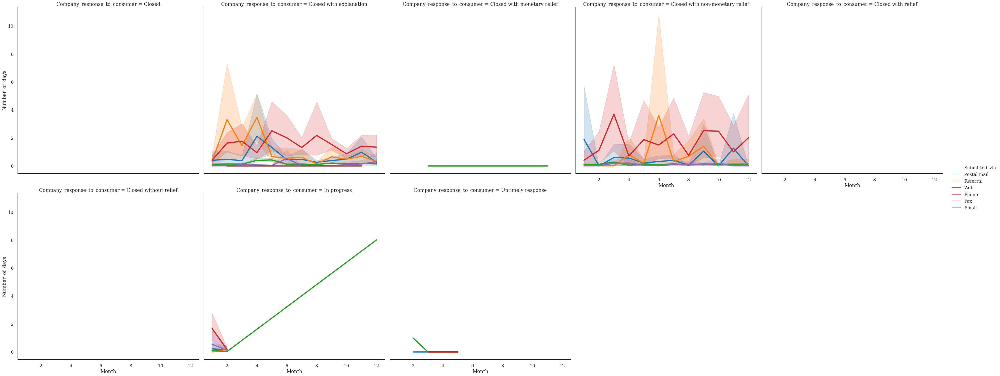

In [76]:
sns.relplot(x="Month", y="Number_of_days", hue="Submitted_via",
            col="Company_response_to_consumer", col_wrap=5,
            height=10, aspect=1.0, linewidth=4.5,
            kind="line", data=EQUIFAX)

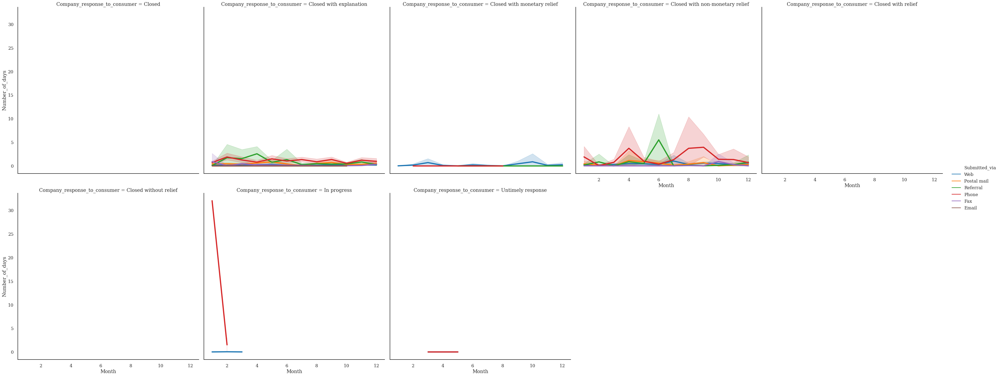

In [77]:
sns.relplot(x="Month", y="Number_of_days", hue="Submitted_via",
            col="Company_response_to_consumer", col_wrap=5,
            height=10, aspect=1.0, linewidth=4.5,
            kind="line", data=TRANSUNION)

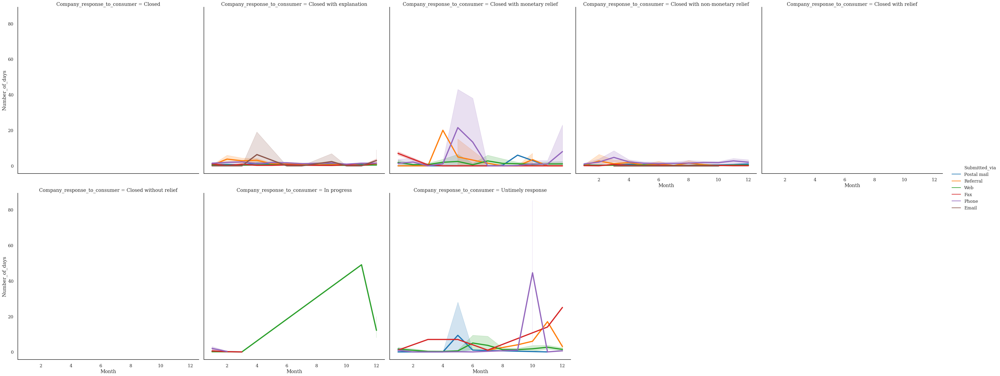

In [78]:
sns.relplot(x="Month", y="Number_of_days", hue="Submitted_via",
            col="Company_response_to_consumer", col_wrap=5,
            height=10, aspect=1.0, linewidth=4.5,
            kind="line", data=prod)

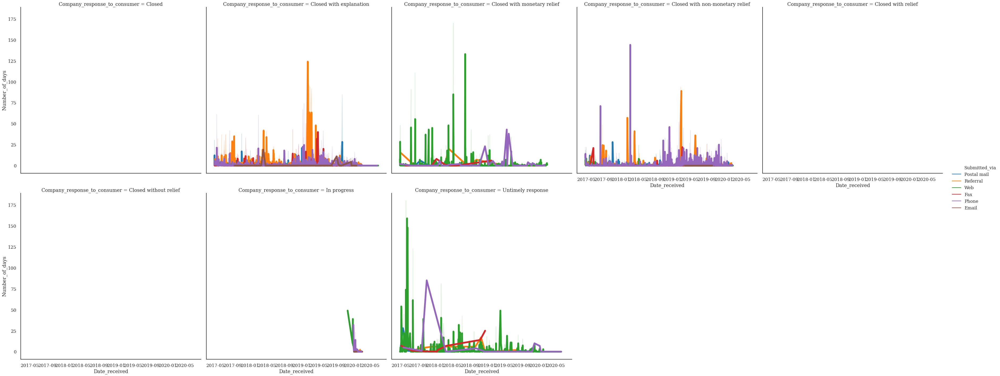

In [79]:
sns.relplot(x="Date_received", y="Number_of_days", hue="Submitted_via",
            col="Company_response_to_consumer", col_wrap=5,
            height=10, aspect=1.0, linewidth=6.5,
            kind="line", data=p1)

<AxesSubplot:xlabel='Date_sent_to_company', ylabel='Number_of_days'>

Text(0.5, 1.0, 'Number of days taken to resolve a complaint which are submitted via for prod category-1 ')

(array([17287., 17410., 17532., 17652., 17775., 17897., 18017., 18140.,
        18262., 18383.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

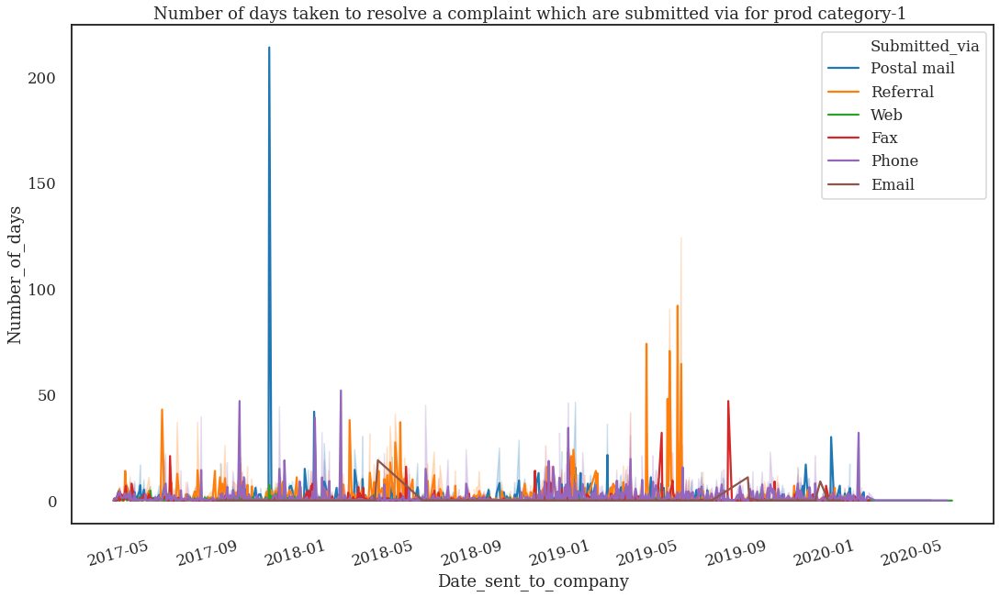

In [81]:
fig = plt.figure(figsize=(18,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

# sns.lineplot(x="Date_sent_to_company", y="Number_of_days",color="red", data=p1)
# plt.xticks(rotation=15)
# plt.title('Number of days taken to resolve a complaint for prod category-1 ')
# plt.show()

sns.lineplot(x='Date_sent_to_company', y='Number_of_days', hue='Submitted_via', 
             data=p1)
plt.title('Number of days taken to resolve a complaint which are submitted via for prod category-1 ')
plt.xticks(rotation=15)
plt.show()




In [82]:
len(p1.Company.unique())
p1.Company.value_counts()[0:10]

1976

EQUIFAX, INC.                             102345
TRANSUNION INTERMEDIATE HOLDINGS, INC.     89810
Experian Information Solutions Inc.        87949
CAPITAL ONE FINANCIAL CORPORATION           5311
SYNCHRONY FINANCIAL                         3178
CITIBANK, N.A.                              2983
JPMORGAN CHASE & CO.                        2704
WELLS FARGO & COMPANY                       2354
BANK OF AMERICA, NATIONAL ASSOCIATION       2025
LEXISNEXIS                                  1971
Name: Company, dtype: int64

<Figure size 1440x1440 with 0 Axes>

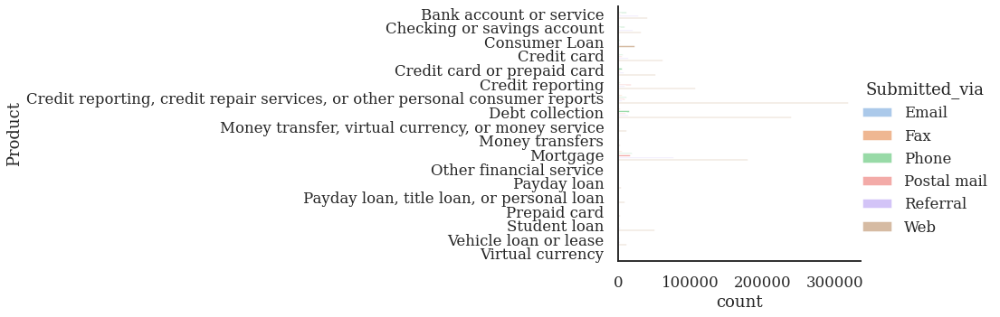

In [83]:
# seaborn.barplot(x=df.reputation.value_counts().index, y=df.reputation.value_counts())
fig = plt.figure(figsize=(20,20))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

sns.catplot(y="Product", hue="Submitted_via", kind="count",
            palette="pastel", edgecolor="1.0",
            data=ts);

<Figure size 2160x2160 with 0 Axes>

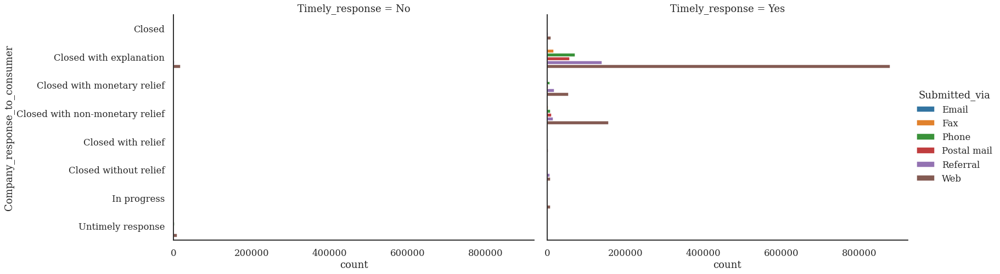

In [84]:
fig = plt.figure(figsize=(30,30))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

g = sns.catplot(y="Company_response_to_consumer", hue="Submitted_via", col="Timely_response",
                data=ts, kind="count", height=7, aspect=1.7)

In [85]:
# # Draw a nested boxplot to show bills by day and time
# a4_dims = (27,12)
# f, ax = plt.subplots(figsize=a4_dims)

# sns.boxplot(ax=ax, y="Sub_product", x="Number_of_days",
#             hue="Submitted_via", palette=["m", "g","r","c","y"],
#             data=p1)
# sns.despine(offset=10, trim=True)


<AxesSubplot:xlabel='Date_received'>

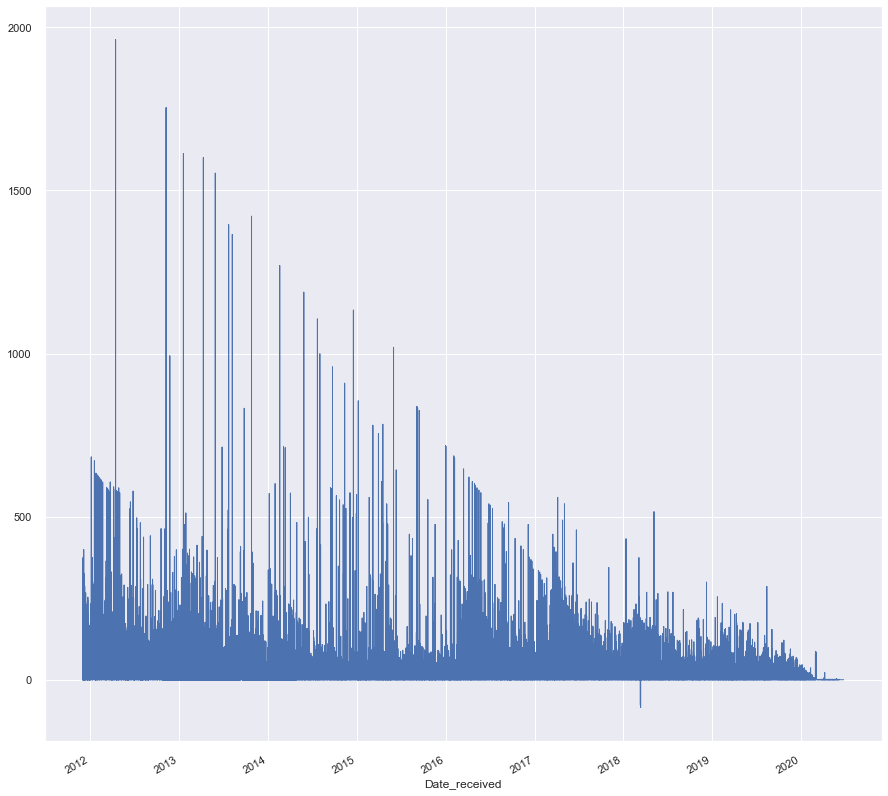

In [86]:
sns.set(rc={'figure.figsize':(15, 15)})
ts_date_received['Number_of_days'].plot(linewidth=1)
# ts_date_received['Number_of_days'].plot(linewidth=0.5)




Text(0, 0.5, 'number of days to solve an issue')

Text(0.5, 1.0, 'Number of days taken to acknowlegde a complaint during Covid for prod category-1 ')

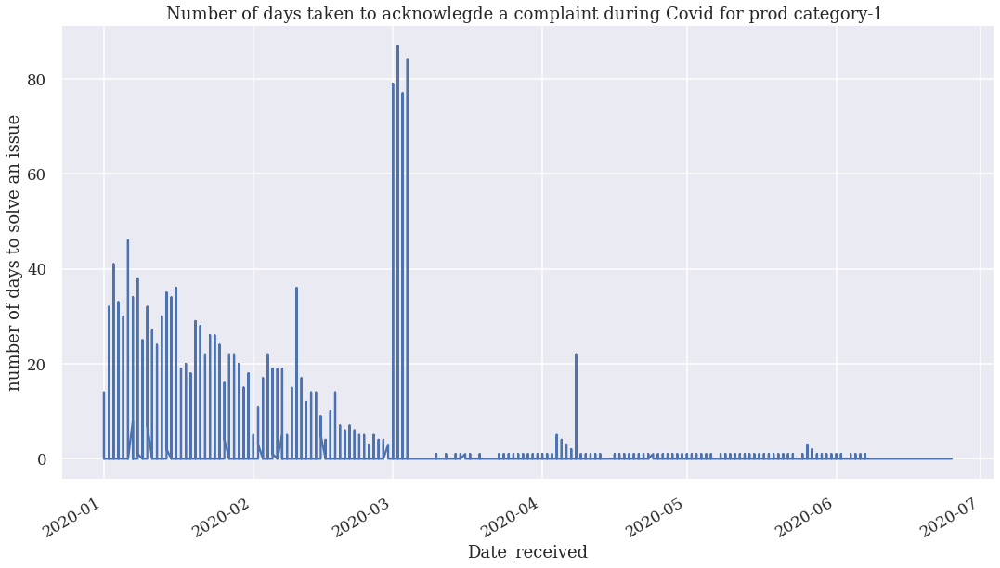

In [87]:
fig = plt.figure(figsize=(18,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

ax = ts_date_received.loc['2020', 'Number_of_days'].plot()
ax.set_ylabel('number of days to solve an issue')
plt.title('Number of days taken to acknowlegde a complaint during Covid for prod category-1 ')

In [88]:
c= ts_date_received[ts_date_received["Number_of_days"]>=80]
cov = c[c["Year"]==2020]
cov[cov["Month"]==3]


,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,...,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID,Number of days,Number_of_days,Year,Month,Weekday_Name
Date_received,,,,,,,,,,,,,,,,,,,,,
2020-03-04,Mortgage,Conventional home mortgage,Applying for a mortgage or refinancing an exis...,NaN,NaN,NaN,WELLS FARGO & COMPANY,NaN,NaN,NaN,...,2020-05-26,Untimely response,No,Unknown,4137287,83 days,83,2020,3,Wednesday
2020-03-04,Mortgage,Conventional home mortgage,Applying for a mortgage or refinancing an exis...,NaN,NaN,NaN,WELLS FARGO & COMPANY,NaN,NaN,NaN,...,2020-05-27,Untimely response,No,Unknown,4137538,84 days,84,2020,3,Wednesday
2020-03-02,Mortgage,Conventional home mortgage,Struggling to pay mortgage,NaN,NaN,NaN,WELLS FARGO & COMPANY,NaN,NaN,NaN,...,2020-05-28,Untimely response,No,Unknown,4137855,87 days,87,2020,3,Monday


In [89]:
# import matplotlib.dates as mdates

# fig, ax = plt.subplots()
# ax.plot(ts_date_received.loc['2020-02':'2020-05', 'Number_of_days'], marker='o', linestyle='-')
# ax.set_ylabel('No of days to solve an issue since consumer has filed an issue')
# ax.set_title('Feb-May 2020, since consumer has filed an issue')
# # Set x-axis major ticks to weekly interval, on Mondays
# ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY))
# # Format x-tick labels as 3-letter month name and day number
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'));

#### Mortgage


In [90]:
mortgage = ts[ts['Product']=="Mortgage"]
mortgage.head(3)


,Date_received,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,Consumer_consent_provided,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID,Number of days,Number_of_days
6,2013-03-28,Mortgage,Other mortgage,Other,NaN,NaN,NaN,WELLS FARGO & COMPANY,GA,30126,NaN,NaN,Referral,2013-03-29,Closed with explanation,Yes,No,367591,1 days,1
29,2014-07-15,Mortgage,Other mortgage,Other,NaN,NaN,NaN,M&T BANK CORPORATION,TN,38125,NaN,NaN,Referral,2014-07-21,Closed with explanation,Yes,No,938243,6 days,6
31,2014-09-25,Mortgage,FHA mortgage,"Loan servicing, payments, escrow account",NaN,NaN,NaN,NATIONSTAR MORTGAGE,CA,92501,NaN,NaN,Web,2014-09-25,Closed with explanation,Yes,No,1045810,0 days,0


<AxesSubplot:xlabel='Date_received', ylabel='Number_of_days'>

(array([14975., 15340., 15706., 16071., 16436., 16801., 17167., 17532.,
        17897., 18262.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

Text(0.5, 1.0, 'Number of days taken to acknowledge a complaint for prod category- mortgage ')

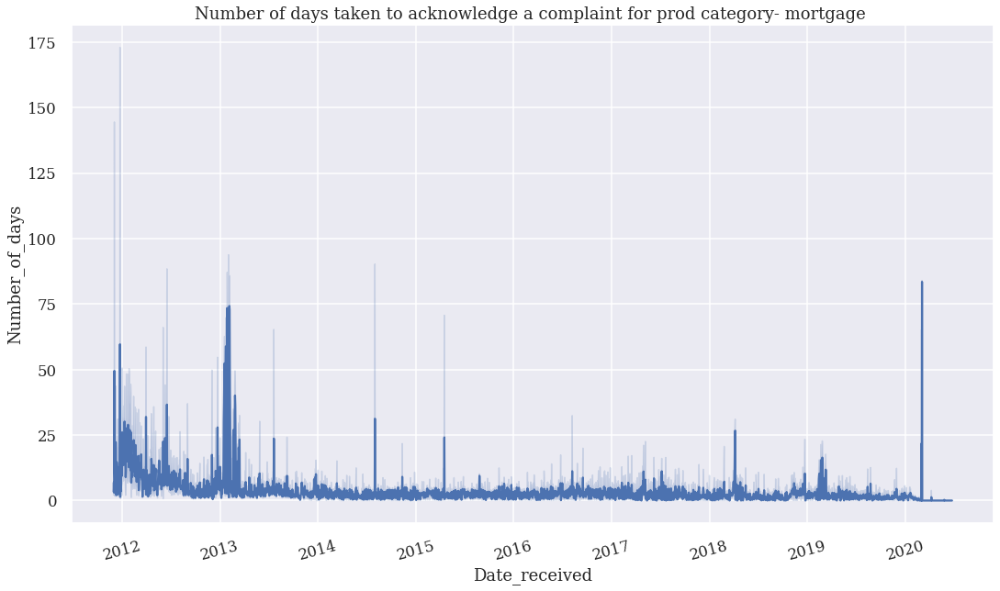

In [91]:
fig = plt.figure(figsize=(18,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

sns.lineplot(x="Date_received", y="Number_of_days", data=mortgage)
plt.xticks(rotation=15)
plt.title('Number of days taken to acknowledge a complaint for prod category- mortgage ')
plt.show()

In [92]:
# mortgage[mortgage["Number_of_days"]>=75]
# mortgage[mortgage["Date_received"]>="2020"]
mortgage.describe()
mortgage.head(1)

,Complaint_ID,Number of days,Number_of_days
count,2.991180e+05,299118,299118.000000
mean,1.609033e+06,4 days 12:34:03.608208131,4.523653
std,1.226100e+06,20 days 12:05:37.971121547,20.503912
min,5.000000e+00,-1 days +00:00:00,-1.000000
25%,4.952082e+05,0 days 00:00:00,0.000000
50%,1.409870e+06,1 days 00:00:00,1.000000
75%,2.403792e+06,3 days 00:00:00,3.000000
max,4.141355e+06,1553 days 00:00:00,1553.000000


,Date_received,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,Consumer_consent_provided,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID,Number of days,Number_of_days
6,2013-03-28,Mortgage,Other mortgage,Other,NaN,NaN,NaN,WELLS FARGO & COMPANY,GA,30126,NaN,NaN,Referral,2013-03-29,Closed with explanation,Yes,No,367591,1 days,1


<AxesSubplot:xlabel='Date_sent_to_company', ylabel='Number_of_days'>

(array([14975., 15340., 15706., 16071., 16436., 16801., 17167., 17532.,
        17897., 18262.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

Text(0.5, 1.0, 'Number of days taken to resolve a complaint for prod category-mortgage ')

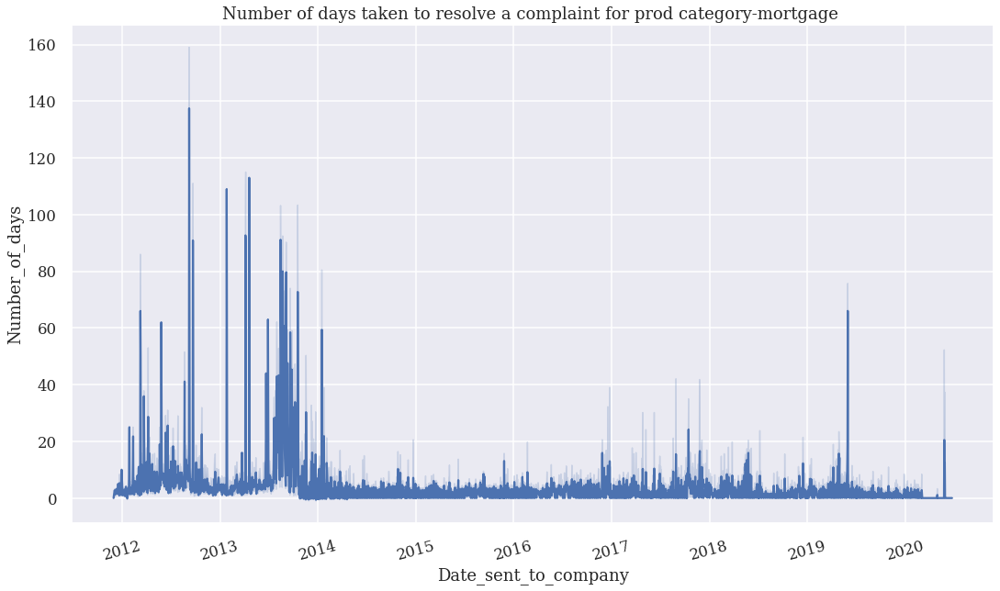

In [93]:
fig = plt.figure(figsize=(18,10))
sns.set_context('talk')
plt.rcParams['font.family'] = "serif"

sns.lineplot(x="Date_sent_to_company", y="Number_of_days", data=mortgage)
plt.xticks(rotation=15)
plt.title('Number of days taken to resolve a complaint for prod category-mortgage ')
plt.show()

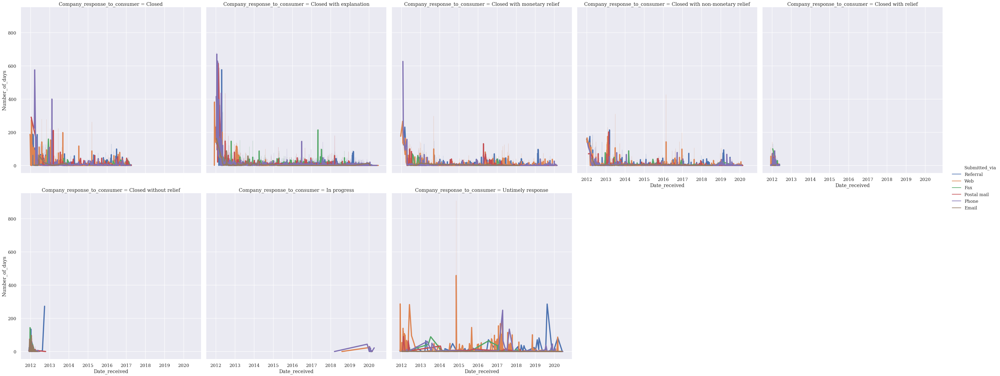

In [94]:
sns.relplot(x="Date_received", y="Number_of_days", hue="Submitted_via",
            col="Company_response_to_consumer", col_wrap=5,
            height=10, aspect=1.0, linewidth=4.5,
            kind="line", data=mortgage)

# TO ESTIMATE THE NUMBER OF COMPLAINTS FOR CREDIT REPORTING CATEGORY

using fbprophet ts, we predict for next year, next month and tomorrow using the previous 5 years of data


In [95]:
import pandas as pd
import numpy as np
from fbprophet import Prophet
%matplotlib inline
import matplotlib.pyplot as plt


import plotly.offline as py
import plotly.graph_objs as go

In [96]:
p1.head(3)
p1.Date_received.describe()

,Date_received,Product,Sub_product,Issue,Sub_issue,Consumer_complaint_narrative,Company_public_response,Company,State,ZIPcode,Tags,Consumer_consent_provided,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Complaint_ID,Number of days,Number_of_days
482,2017-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,NaN,NaN,"EQUIFAX, INC.",IL,60653,NaN,NaN,Postal mail,2017-10-12,Closed with explanation,Yes,Unknown,2700307,0 days,0
847,2018-05-23,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,NaN,NaN,"EQUIFAX, INC.",FL,34761,NaN,NaN,Referral,2018-05-23,Closed with explanation,Yes,Unknown,3481731,0 days,0
942,2018-11-07,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Information belongs to someone else,NaN,NaN,"EQUIFAX, INC.",NaN,NaN,NaN,NaN,Postal mail,2018-11-07,Closed with explanation,Yes,Unknown,3552603,0 days,0


count                  352638
unique                   1148
top       2017-09-08 00:00:00
freq                     3101
first     2017-04-24 00:00:00
last      2020-06-25 00:00:00
Name: Date_received, dtype: object

In [97]:
sdate = '2017-04-24'
edate = '2020-06-25'

In [98]:
from datetime import datetime
from dateutil.parser import parse
import pandas as pd


s = datetime.strptime(sdate, '%Y-%m-%d') 
e = datetime.strptime(edate, '%Y-%m-%d') 




# type(a)
# a.year
# a.day
# a.month

In [99]:
days = abs(s - e)
print("days delta is",days.days)
d=days.days

p = int(d +1)
print("p is", p)

hr_counter = 24

m = p*hr_counter
print("m is", m)

days delta is 1158
p is 1159
m is 27816


In [100]:
# importing datetime module 
import datetime 
  
# date in yyyy/mm/dd format 
sd = datetime.datetime(s.year, s.month, s.day) 
ed = datetime.datetime(e.year, e.month, e.day)
print(sd)
print(ed)



if sd > ed:
    print(" date input invalid")
    print("Please enter a start date less than the end date")
    
elif sd < ed:
    print("sd is less and is correct")
    dates = pd.date_range(start=sdate,periods= m, freq ='H')
    fb_p = pd.DataFrame(dates, columns=['ds'])
    print(fb_p)
    print(fb_p.shape)
    
else:
    print("days delts is 0, equal")
    date_r = pd.date_range(start=sdate, periods = hr_counter, freq ='H')
    fb_p = pd.DataFrame(date_r, columns=['ds'])
    print(fb_p)
    print(fb_p.shape)








2017-04-24 00:00:00
2020-06-25 00:00:00
sd is less and is correct
                       ds
0     2017-04-24 00:00:00
1     2017-04-24 01:00:00
2     2017-04-24 02:00:00
3     2017-04-24 03:00:00
4     2017-04-24 04:00:00
...                   ...
27811 2020-06-25 19:00:00
27812 2020-06-25 20:00:00
27813 2020-06-25 21:00:00
27814 2020-06-25 22:00:00
27815 2020-06-25 23:00:00

[27816 rows x 1 columns]
(27816, 1)


In [101]:
p1['Date_received'] = p1.Date_received.astype('category')

da=p1['Date_received'].value_counts()
da = pd.DataFrame({'dates':da.index, 'Vals':da.values})


fb_p['y']=da["Vals"]

In [102]:
fb_p.shape

(27816, 2)

In [103]:
prophet_basic = Prophet()
prophet_basic.fit(fb_p)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


In [104]:
fb_p.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27816 entries, 0 to 27815
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      27816 non-null  datetime64[ns]
 1   y       1148 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 434.8 KB


In [105]:
# future= prophet_basic.make_future_dataframe(periods=1)
# future.tail(2)

# for the next day
future = prophet_basic.make_future_dataframe(freq='H',periods=1)
future.tail(2)
# forecasts = prophet_basic.predict(future)

,ds
27815,2020-06-25 23:00:00
27816,2020-06-26 00:00:00


In [106]:
forecast=prophet_basic.predict(future)
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-04-24 00:00:00,852.659725,793.853890,1012.445879,852.659725,852.659725,47.067471,47.067471,47.067471,25.587005,25.587005,25.587005,21.480466,21.480466,21.480466,0.0,0.0,0.0,899.727195
1,2017-04-24 01:00:00,847.113113,780.918376,1001.537571,847.113113,847.113113,46.101361,46.101361,46.101361,25.344431,25.344431,25.344431,20.756929,20.756929,20.756929,0.0,0.0,0.0,893.214473
2,2017-04-24 02:00:00,841.566500,767.497936,985.052285,841.566500,841.566500,34.163829,34.163829,34.163829,14.274706,14.274706,14.274706,19.889124,19.889124,19.889124,0.0,0.0,0.0,875.730330
3,2017-04-24 03:00:00,836.019888,746.613239,960.780690,836.019888,836.019888,18.997678,18.997678,18.997678,0.115537,0.115537,0.115537,18.882141,18.882141,18.882141,0.0,0.0,0.0,855.017567
4,2017-04-24 04:00:00,830.473276,738.628171,937.614522,830.473276,830.473276,9.402493,9.402493,9.402493,-8.339930,-8.339930,-8.339930,17.742423,17.742423,17.742423,0.0,0.0,0.0,839.875770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27812,2020-06-25 20:00:00,-21992.111598,-179199.458230,126753.538247,-179138.715563,126740.793232,-7.603150,-7.603150,-7.603150,-7.896705,-7.896705,-7.896705,0.293555,0.293555,0.293555,0.0,0.0,0.0,-21999.714748
27813,2020-06-25 21:00:00,-21992.935829,-179164.297399,126740.442881,-179148.550522,126744.139249,-7.137140,-7.137140,-7.137140,-8.068736,-8.068736,-8.068736,0.931596,0.931596,0.931596,0.0,0.0,0.0,-22000.072969
27814,2020-06-25 22:00:00,-21993.760060,-179232.069038,126795.877435,-179158.385481,126747.485266,2.184206,2.184206,2.184206,0.607409,0.607409,0.607409,1.576797,1.576797,1.576797,0.0,0.0,0.0,-21991.575854
27815,2020-06-25 23:00:00,-21994.584290,-179084.629614,126787.000515,-179168.220440,126750.831283,17.043042,17.043042,17.043042,14.821137,14.821137,14.821137,2.221905,2.221905,2.221905,0.0,0.0,0.0,-21977.541248


In [107]:
py.iplot([
    go.Scatter(x=fb_p['ds'], y=fb_p['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [108]:
# month 

m1 = Prophet(daily_seasonality=True)
m1.fit(fb_p)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


In [109]:
future1 = m1.make_future_dataframe(periods=1,freq='MS')
forecast1 = m1.predict(future1)
forecast1.tail().T

,27812,27813,27814,27815,27816
ds,2020-06-25 20:00:00,2020-06-25 21:00:00,2020-06-25 22:00:00,2020-06-25 23:00:00,2020-07-01 23:00:00
trend,-21992.1,-21992.9,-21993.8,-21994.6,-22113.3
yhat_lower,-175571,-175524,-175631,-175597,-176865
yhat_upper,128564,128324,128493,128606,129336
trend_lower,-175579,-175587,-175595,-175603,-176779
trend_upper,128454,128462,128470,128477,129255
additive_terms,-7.60315,-7.13714,2.18421,17.043,10.0965
additive_terms_lower,-7.60315,-7.13714,2.18421,17.043,10.0965
additive_terms_upper,-7.60315,-7.13714,2.18421,17.043,10.0965
daily,-7.8967,-8.06874,0.607409,14.8211,14.8211


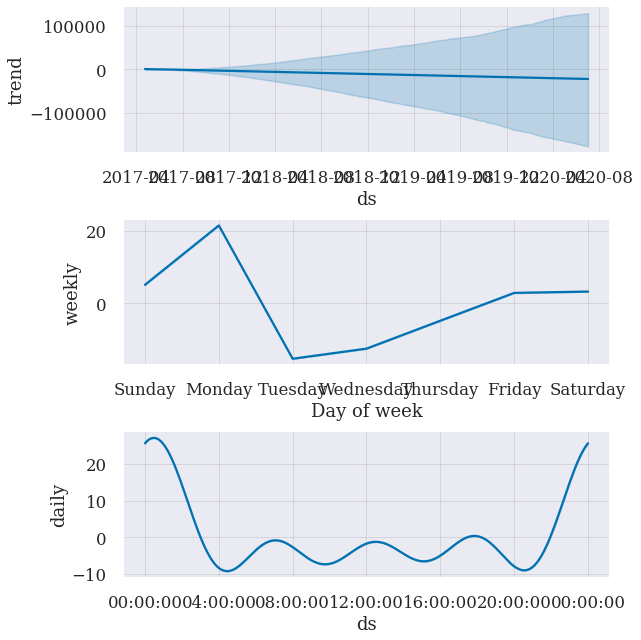

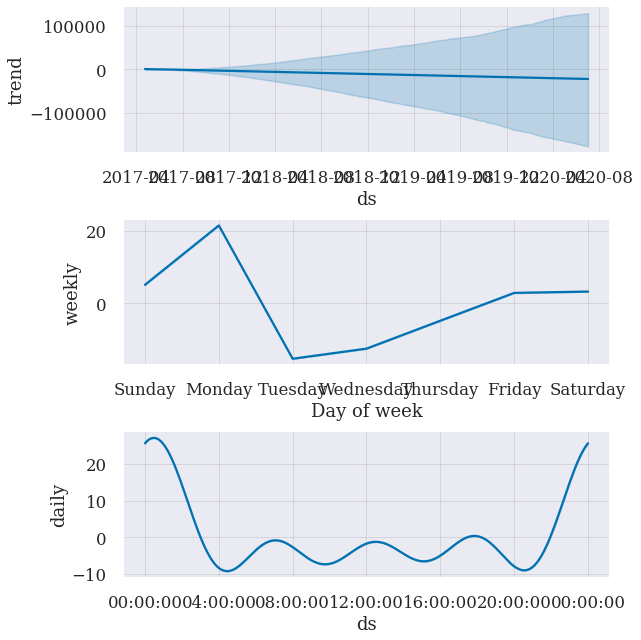

In [110]:
m1.plot_components(forecast1)

In [111]:
# py.iplot([
#     go.Scatter(x=m1['ds'], y=m1['y'], name='y'),
#     go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
#     go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
#     go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
#     go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
# ])

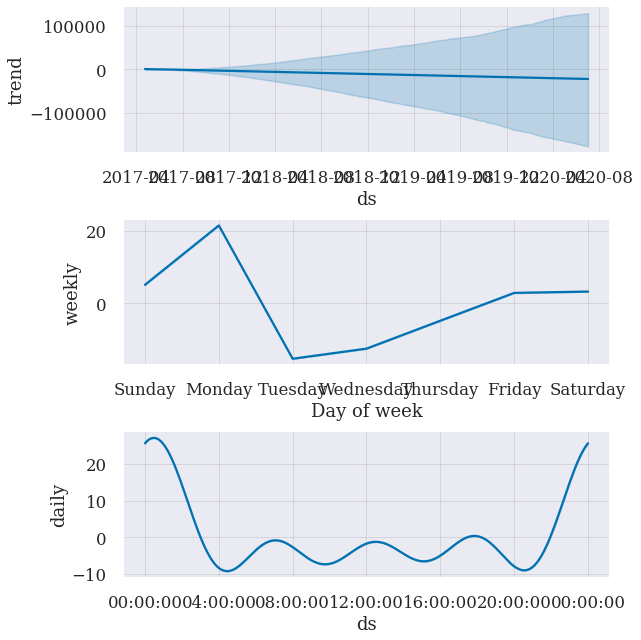

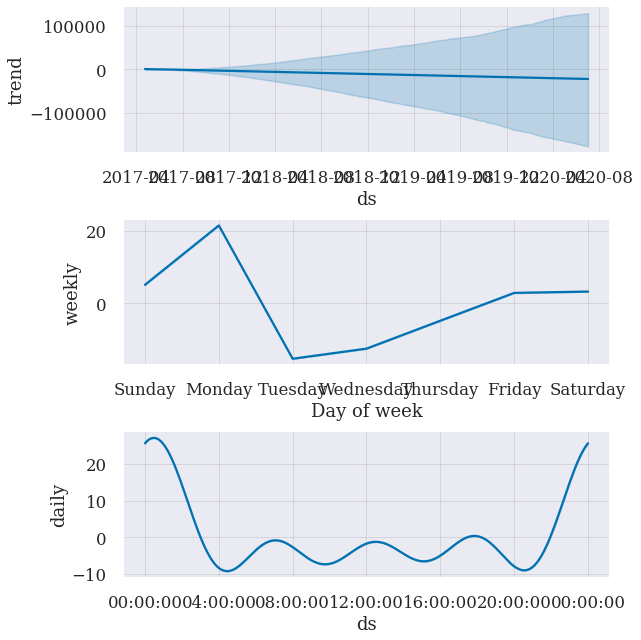

In [112]:
m1.plot_components(forecast1)

In [113]:
# a year with 12 periods 

future_dates = m1.make_future_dataframe(periods=12, freq='MS')
forecasty = m1.predict(future_dates)
forecasty.tail().T

,27823,27824,27825,27826,27827
ds,2021-02-01 23:00:00,2021-03-01 23:00:00,2021-04-01 23:00:00,2021-05-01 23:00:00,2021-06-01 23:00:00
trend,-26366.3,-26920.2,-27533.4,-28126.9,-28740.1
yhat_lower,-228202,-236389,-242151,-252664,-262909
yhat_upper,173550,178930,187004,192413,198215
trend_lower,-228089,-236231,-242068,-252788,-262924
trend_upper,173591,178947,187007,192507,198102
additive_terms,0.799857,0.799857,17.043,18.8719,1.42927
additive_terms_lower,0.799857,0.799857,17.043,18.8719,1.42927
additive_terms_upper,0.799857,0.799857,17.043,18.8719,1.42927
daily,14.8211,14.8211,14.8211,14.8211,14.8211


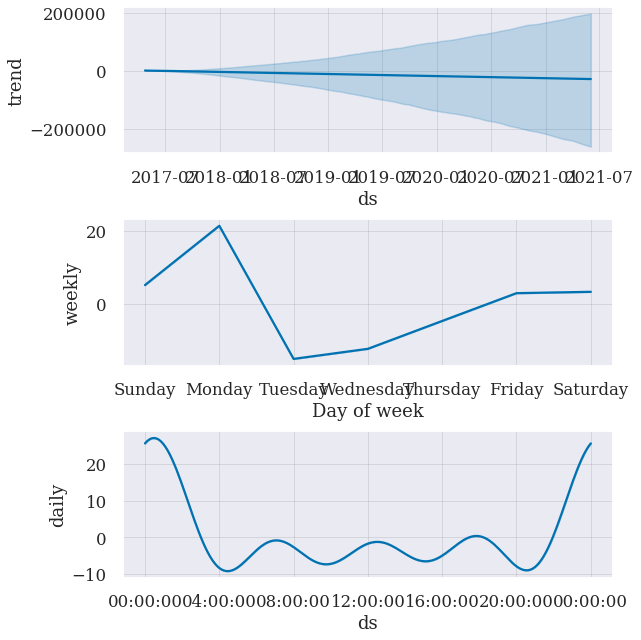

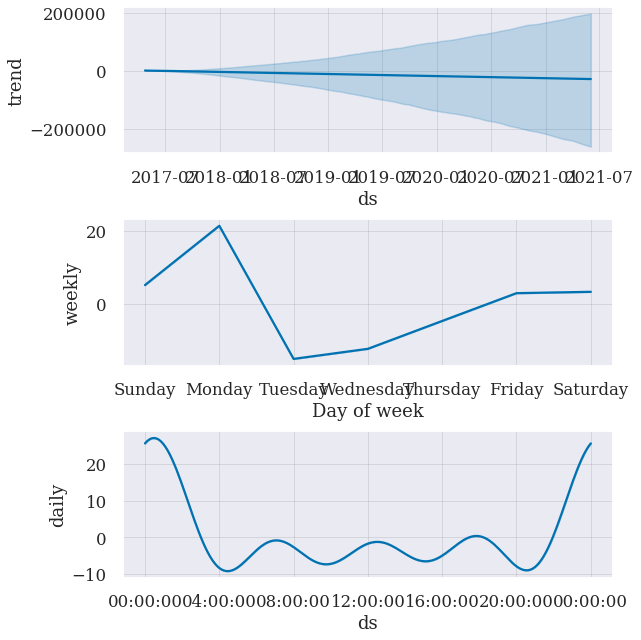

In [114]:
m1.plot_components(forecasty)

In [115]:
# da=p1['Date_received'].str.strip("'").value_counts()[0:10]
# pr
# prc=pd.DataFrame({'prod':pr.index, 'Vals':pr.values})

# # f, ax = plt.subplots(figsize=(7, 3))
# g = sns.barplot(x=prc['Vals'], y=prc['prod'], ci=None, color="c")
# g.set(xlabel= "Number of Complaints", ylabel="Company", title = "Top 10 Companies")

# To see how diff time series prediction works 



In [118]:
prod.head(2)
# we just need the Number_of_days

,Product,Sub_product,Issue,Sub_issue,Company,State,Submitted_via,Date_sent_to_company,Company_response_to_consumer,Timely_response,Consumer_disputed,Number of days,Number_of_days,Year,Month,Weekday_Name
Date_received,,,,,,,,,,,,,,,,
2017-10-12,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account status incorrect,"EQUIFAX, INC.",IL,Postal mail,2017-10-12,Closed with explanation,Yes,Unknown,0 days,0,2017,10,Thursday
2018-05-23,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Account information incorrect,"EQUIFAX, INC.",FL,Referral,2018-05-23,Closed with explanation,Yes,Unknown,0 days,0,2018,5,Wednesday


In [119]:
ts_cr = prod.copy()





In [120]:
ts_cr.drop('Product', axis=1, inplace=True)
ts_cr.drop('Sub_product', axis=1, inplace=True)
ts_cr.drop('Issue', axis=1, inplace=True)
ts_cr.drop('Sub_issue', axis=1, inplace=True)
ts_cr.drop('Company', axis=1, inplace=True)
ts_cr.drop('State', axis=1, inplace=True)
ts_cr.drop('Submitted_via', axis=1, inplace=True)
ts_cr.drop('Date_sent_to_company', axis=1, inplace=True)
ts_cr.drop('Company_response_to_consumer', axis=1, inplace=True)
ts_cr.drop('Timely_response', axis=1, inplace=True)
ts_cr.drop('Consumer_disputed', axis=1, inplace=True)
ts_cr.drop('Number of days', axis=1, inplace=True)

ts_cr.drop('Year', axis=1, inplace=True)

ts_cr.drop('Month', axis=1, inplace=True)
ts_cr.drop('Weekday_Name', axis=1, inplace=True)





<Figure size 1296x360 with 0 Axes>

Text(0.5, 1.0, 'No. of days')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Number_of_days')

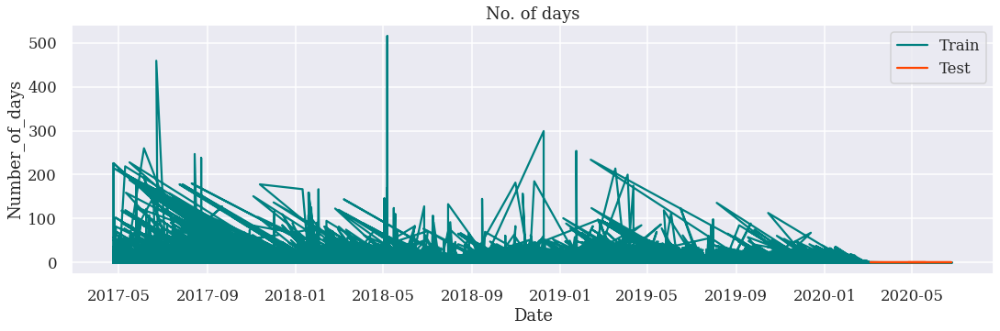

In [121]:

days = 250
train = ts_cr.iloc[:-days,0:1].copy()
test = ts_cr.iloc[-days:,0:1].copy()
plt.figure(figsize=(18,5))
plt.title('No. of days')
plt.plot(train['Number_of_days'], color='teal')
plt.plot(test['Number_of_days'], color='orangered')
plt.legend(['Train','Test'])
plt.xlabel('Date')
plt.ylabel('Number_of_days')
plt.show()

In [122]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from matplotlib.animation import FuncAnimation
from math import sqrt

In [123]:
#creating a function to plot the graph and show the test result:
def check_stationarity(y, lags_plots=48, figsize=(22,8)):
    "Use Series as parameter"
    
    y = pd.Series(y)
    fig = plt.figure()

    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=2)
    ax2 = plt.subplot2grid((3, 3), (1, 0))
    ax3 = plt.subplot2grid((3, 3), (1, 1))
    ax4 = plt.subplot2grid((3, 3), (2, 0), colspan=2)

    y.plot(ax=ax1, figsize=figsize, color='teal')
    ax1.set_title('Number_of_days')
    plot_acf(y, lags=lags_plots, zero=False, ax=ax2, color='teal');
    plot_pacf(y, lags=lags_plots, zero=False, ax=ax3, method='ols', color='teal');
    sns.distplot(y, bins=int(sqrt(len(y))), ax=ax4, color='teal')
    ax4.set_title('Number_of_days Distribution')

    plt.tight_layout()
    
    print('Dickey-Fuller test results:')
    adfinput = adfuller(y)
    adftest = pd.Series(adfinput[0:4], index=['Statistical Test','P-Value','Used Lags','Observations Number'])
    adftest = round(adftest,4)
    
    for key, value in adfinput[4].items():
        adftest["Critical Values (%s)"%key] = value.round(4)
        
    print(adftest)

Dickey-Fuller test results:
Statistical Test            -55.1620
P-Value                       0.0000
Used Lags                    86.0000
Observations Number      352301.0000
Critical Values (1%)         -3.4304
Critical Values (5%)         -2.8615
Critical Values (10%)        -2.5668
dtype: float64


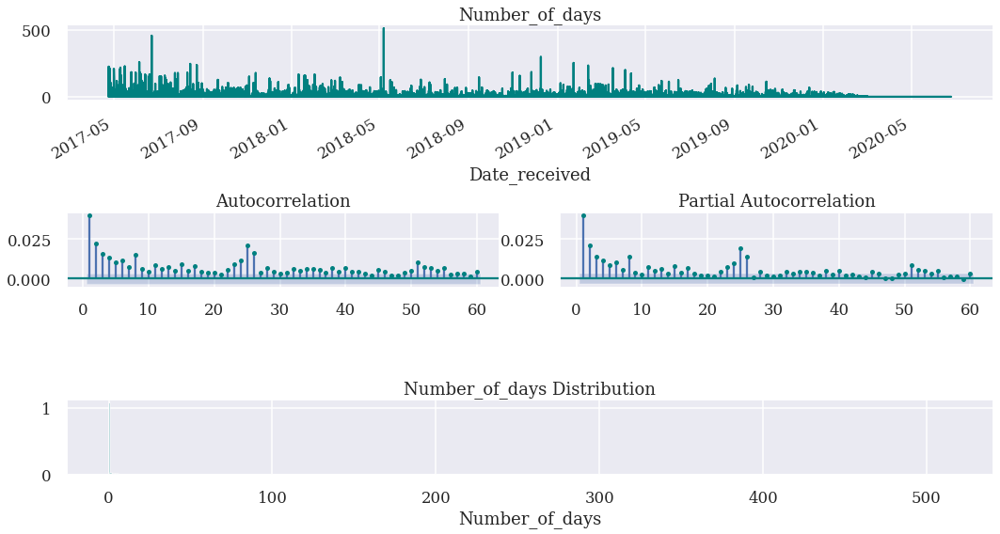

In [124]:
check_stationarity(train['Number_of_days'], lags_plots=60)


- Dickey-Fuller test's P-value: we reject null hypothesis decides which implies that its stationary.
- Based on this result we continue with Time series prediction and the model is perfectly prepared for it.

### Indexed with Date_sent_to_company - ts2

In [ ]:
# ts_date_sent_to_comp = ts.set_index('Date_sent_to_company')
# ts_date_sent_to_comp.head()

In [ ]:
# ts_date_sent_to_comp['Year'] = ts_date_sent_to_comp.index.year
# ts_date_sent_to_comp['Month'] = ts_date_sent_to_comp.index.month
# ts_date_sent_to_comp['Weekday_Name'] = ts_date_sent_to_comp.index.day_name()



In [ ]:
# sns.set(rc={'figure.figsize':(15, 15)})
# ts_date_sent_to_comp['Number_of_days'].plot(linewidth=1)
# # ts_date_received['Number_of_days'].plot(linewidth=0.5)




In [ ]:
# ax = ts_date_sent_to_comp.loc['2020', 'Number_of_days'].plot()
# ax.set_ylabel('number of days to solve an issue');

In [ ]:
# import matplotlib.dates as mdates

# fig, ax = plt.subplots()
# ax.plot(ts_date_sent_to_comp.loc['2020-05':'2020-07', 'Number_of_days'], marker='o', linestyle='-')
# ax.set_ylabel('No of days to solve an issue since recieved by the company')
# ax.set_title('May-July 2020, after the company recieved the complaints')
# # Set x-axis major ticks to weekly interval, on Mondays
# ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY))
# # Format x-tick labels as 3-letter month name and day number
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'));